In [7]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import seaborn as sns

▪ **DEPTH_MD**, merupakan measured depth (ft)

▪ **CALI**, merupakan bacaan log caliper (ft)

▪ **RSHA**, merupakan bacaan log resistivity shallow (ohm.m)

▪ **RMED**, merupakan bacaan log resistivity medium (ohm.m)

▪ **RDEP**, merupakan bacaan log resistivity deep (ohm.m)

▪ **RHOB**, merupakan bacaan log formation (bulk) density (gr/cc)

▪ **GR**, merupakan bacaan log gamma ray (API)

▪ **NPHI**, merupakan porositas yang terbaca dari log neutron (fraction)

▪ **PEF**, merupakan bacaan log photoelectric absorption (barns/electron)

▪ **DTC**, merupakan bacaan transit-time compressional wave dari sonic log (micron-s/ft)

▪ **SP**, merupakan bacaan log spontaneous potential (mV)

▪ **BS**, merupakan bit size (in) yang digunakan selama pengeboran

▪ **ROP**, merupakan rate of penetration (ft per minute) yang dibaca selama pengeboran

▪ **DRHO**, merupakan density correction curve (gr/cc) yang menunjukkan kualitas data bacaan bulk density

▪ **FACIES**, merupakan label fasies. Tidak terdapat informasi detail mengenai lithologi dan karakteristik dari setiap kelas fasies

# DATASET

In [8]:
datasetA = pd.read_csv('https://raw.githubusercontent.com/XONESEC/Facies-Classification-in-Hydrocarbon-Reservoirs-Using-Well-Logs-and-Machine-Learning/refs/heads/main/A.csv')
datasetA

,DEPTH_MD,CALI,RSHA,RMED,RDEP,RHOB,GR,NPHI,PEF,DTC,SP,BS,ROP,DRHO,FACIES
0,734.419199,12.787381,NaN,1.407795,1.472684,NaN,118.992989,NaN,NaN,154.404816,NaN,9.875,26.911829,NaN,1
1,734.571200,12.790987,NaN,1.394810,1.464091,NaN,124.514305,NaN,NaN,154.974701,NaN,9.875,26.133530,NaN,1
2,734.723199,12.801331,NaN,1.377496,1.434632,NaN,126.779854,NaN,NaN,155.762970,NaN,9.875,27.482636,NaN,1
3,734.875200,12.628396,NaN,1.369218,1.419665,NaN,127.186066,NaN,NaN,156.187897,NaN,9.875,28.694523,NaN,1
4,735.027200,12.528492,NaN,1.373198,1.427742,NaN,125.184708,NaN,NaN,157.038986,NaN,9.875,28.981676,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10703,2361.275200,8.588360,NaN,NaN,NaN,2.431011,76.103134,NaN,3.360630,NaN,NaN,8.500,20.665428,-0.004571,3
10704,2361.427200,8.587591,NaN,NaN,NaN,2.426531,80.997704,NaN,3.400784,NaN,NaN,8.500,20.686266,-0.002504,3
10705,2361.579200,8.594840,NaN,NaN,NaN,2.422308,84.447113,NaN,3.389910,NaN,NaN,8.500,20.591324,0.000504,3
10706,2361.731200,8.594312,NaN,NaN,NaN,2.423292,86.449379,NaN,3.397406,NaN,NaN,8.500,19.437052,0.000550,3


In [9]:
datasetB = pd.read_csv('https://raw.githubusercontent.com/XONESEC/Facies-Classification-in-Hydrocarbon-Reservoirs-Using-Well-Logs-and-Machine-Learning/refs/heads/main/B.csv')
datasetB

,DEPTH_MD,CALI,RSHA,RMED,RDEP,RHOB,GR,NPHI,PEF,DTC,SP,BS,ROP,DRHO,FACIES
0,684.270396,13.042573,NaN,1.414800,1.419300,NaN,88.937462,0.455408,NaN,159.805603,NaN,9.875,39.320923,NaN,1
1,684.422396,13.333869,NaN,1.392074,1.398481,NaN,87.800705,0.450693,NaN,158.900360,NaN,9.875,33.086723,NaN,1
2,684.574396,13.426064,NaN,1.435466,1.449827,NaN,86.460014,0.450432,NaN,156.982590,NaN,9.875,28.410923,NaN,1
3,684.726396,13.320748,NaN,1.458956,1.479819,NaN,85.662811,0.461263,NaN,155.278259,NaN,9.875,19.690228,NaN,1
4,684.878396,13.156784,NaN,1.394103,1.403053,NaN,86.043411,0.464723,NaN,155.096039,NaN,9.875,15.122011,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10020,2207.310396,8.698007,NaN,5.382444,5.339929,2.531374,127.456139,NaN,3.607062,NaN,NaN,8.500,22.291321,0.107520,2
10021,2207.462396,8.721210,NaN,5.651109,5.689734,2.526128,128.403305,NaN,3.609151,NaN,NaN,8.500,22.230320,0.101821,2
10022,2207.614396,8.739136,NaN,5.870602,5.496074,2.528934,127.829262,NaN,3.594580,NaN,NaN,8.500,22.388054,0.097832,2
10023,2207.766396,8.749738,NaN,5.756996,5.345353,2.527052,126.552277,NaN,3.534883,NaN,NaN,8.500,23.331690,0.092334,2


In [10]:
datasetC = pd.read_csv('https://raw.githubusercontent.com/XONESEC/Facies-Classification-in-Hydrocarbon-Reservoirs-Using-Well-Logs-and-Machine-Learning/refs/heads/main/C.csv')
datasetC

,DEPTH_MD,CALI,RSHA,RMED,RDEP,RHOB,GR,NPHI,PEF,DTC,SP,BS,ROP,DRHO,FACIES
0,735.186799,13.305768,NaN,1.173534,1.168746,NaN,95.069916,0.106903,NaN,NaN,NaN,9.875,28.763554,NaN,1
1,735.338799,13.382214,NaN,1.173070,1.168229,NaN,93.822601,0.108549,NaN,NaN,NaN,9.875,28.810400,NaN,1
2,735.490799,13.448009,NaN,1.166865,1.160968,NaN,92.680122,0.114742,NaN,NaN,NaN,9.875,28.997326,NaN,1
3,735.642799,13.309155,NaN,1.158761,1.150311,NaN,93.568855,0.120261,NaN,NaN,NaN,9.875,29.191469,NaN,1
4,735.794799,13.254792,NaN,1.157357,1.146551,NaN,95.206711,0.124738,NaN,NaN,NaN,9.875,29.253410,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9133,2123.402799,8.465826,NaN,1.508918,1.399308,2.560775,29.390390,NaN,4.527966,NaN,NaN,8.500,14.614906,0.082481,8
9134,2123.554799,8.461417,NaN,1.714523,1.421449,2.553309,21.255514,NaN,4.415823,NaN,NaN,8.500,13.537938,0.078607,8
9135,2123.706799,8.473491,NaN,1.770941,1.414646,2.515362,19.803230,NaN,4.339602,NaN,NaN,8.500,11.451546,0.067462,8
9136,2123.858799,8.459172,NaN,2.338948,2.335207,2.499653,19.054888,NaN,4.305042,NaN,NaN,8.500,11.103429,0.065294,8


In [11]:
datasetA.describe()

,DEPTH_MD,CALI,RSHA,RMED,RDEP,RHOB,GR,NPHI,PEF,DTC,SP,BS,ROP,DRHO,FACIES
count,10708.000000,10708.000000,0.0,10675.000000,10699.000000,10396.000000,10708.000000,10565.000000,10396.000000,10643.000000,0.0,10708.000000,10708.000000,10472.000000,10708.000000
mean,1548.151200,11.950260,NaN,1.961810,2.429378,2.192330,77.563081,0.364623,3.997361,121.281544,NaN,11.631062,26.305218,-0.005509,2.369817
std,469.874207,1.397405,NaN,8.850138,9.278286,0.168446,37.323180,0.119055,1.250122,25.101314,NaN,1.376402,16.751751,0.017869,1.707573
min,734.419199,8.145307,NaN,0.474081,0.486116,1.693096,11.502922,0.050570,1.658541,54.553902,NaN,8.500000,0.703106,-0.107703,1.000000
25%,1141.285200,12.251666,NaN,0.899736,0.923974,2.073405,47.014977,0.253130,3.142870,97.754444,NaN,12.250001,13.320444,-0.014262,1.000000
50%,1548.151200,12.354126,NaN,1.171032,1.189772,2.153903,82.617432,0.383974,3.600720,133.448593,NaN,12.250001,25.066311,-0.008271,2.000000
75%,1955.017200,12.594305,NaN,1.617270,1.634245,2.348827,105.282234,0.462687,4.605149,140.252808,NaN,12.250001,36.628877,-0.000303,4.000000
max,2361.883200,14.336007,NaN,726.232300,164.291443,2.789680,183.531326,0.768312,11.641782,169.838211,NaN,12.250001,299.693603,0.433157,6.000000


In [12]:
datasetB.describe()

,DEPTH_MD,CALI,RSHA,RMED,RDEP,RHOB,GR,NPHI,PEF,DTC,SP,BS,ROP,DRHO,FACIES
count,10025.000000,10025.000000,0.0,9997.000000,10025.000000,9683.000000,10025.000000,9898.000000,9683.000000,9951.000000,0.0,10025.000000,10002.000000,9818.000000,10025.000000
mean,1446.094396,11.668981,NaN,2.325415,2.348347,2.209456,85.457099,0.382570,4.260216,125.482436,NaN,11.403843,27.931811,0.007988,2.235910
std,439.905109,1.697377,NaN,23.227161,25.313340,0.181823,30.916713,0.127525,1.032569,28.851532,NaN,1.552539,11.119808,0.024426,1.784395
min,684.270396,7.886668,NaN,0.323498,0.318176,1.732161,12.951102,0.003064,2.095339,48.621746,NaN,8.500000,3.744495,-0.062866,1.000000
25%,1065.182396,12.308855,NaN,0.767469,0.767442,2.073498,66.734016,0.296297,3.531847,104.567440,NaN,12.250001,21.120004,-0.003061,1.000000
50%,1446.094396,12.450414,NaN,1.080871,1.088220,2.160631,89.030411,0.422447,3.999938,139.798248,NaN,12.250001,28.094605,0.003428,1.000000
75%,1827.006396,12.569870,NaN,1.434595,1.444758,2.359909,106.611389,0.475887,4.760748,146.639832,NaN,12.250001,34.264581,0.011997,4.000000
max,2207.918396,17.171694,NaN,1366.792481,1596.285523,2.744634,268.161072,0.749615,11.062059,177.843659,NaN,12.250001,267.704407,0.218060,7.000000


In [13]:
datasetC.describe()

,DEPTH_MD,CALI,RSHA,RMED,RDEP,RHOB,GR,NPHI,PEF,DTC,SP,BS,ROP,DRHO,FACIES
count,9138.000000,8968.000000,0.0,9138.000000,9138.000000,8823.000000,9138.000000,8921.000000,8823.000000,8883.000000,0.0,9138.000000,9138.000000,8942.000000,9138.000000
mean,1429.598799,11.639647,NaN,1.983201,1.970796,2.195239,80.032915,0.374550,4.324007,126.123174,NaN,11.376749,22.214363,0.020637,2.369884
std,400.984773,1.713393,NaN,7.134676,5.724232,0.176702,39.428555,0.124072,1.835357,25.914976,NaN,1.573902,11.603424,0.050196,1.839749
min,735.186799,8.339603,NaN,0.391073,0.481164,1.556648,6.510116,0.011889,2.244937,53.045765,NaN,8.500000,1.073425,-0.115128,1.000000
25%,1082.392799,12.260231,NaN,0.880868,0.991725,2.068548,51.946794,0.276167,3.268505,102.366589,NaN,12.250001,13.829711,-0.009554,1.000000
50%,1429.598799,12.426505,NaN,1.291071,1.343761,2.159169,80.563698,0.403234,3.871344,138.878448,NaN,12.250001,21.571633,-0.001591,1.000000
75%,1776.804799,12.536891,NaN,1.654490,1.801376,2.350287,105.274719,0.468591,5.062659,145.895966,NaN,12.250001,28.440702,0.025132,4.000000
max,2124.010799,17.688429,NaN,286.298096,225.011490,2.752122,726.266113,0.746968,29.109318,167.480225,NaN,12.250001,83.766693,0.436384,8.000000


In [14]:
datasetA.columns

Index(['DEPTH_MD', 'CALI', 'RSHA', 'RMED', 'RDEP', 'RHOB', 'GR', 'NPHI', 'PEF',
       'DTC', 'SP', 'BS', 'ROP', 'DRHO', 'FACIES'],
      dtype='object')

In [15]:
datasetB.columns

Index(['DEPTH_MD', 'CALI', 'RSHA', 'RMED', 'RDEP', 'RHOB', 'GR', 'NPHI', 'PEF',
       'DTC', 'SP', 'BS', 'ROP', 'DRHO', 'FACIES'],
      dtype='object')

In [16]:
datasetC.columns

Index(['DEPTH_MD', 'CALI', 'RSHA', 'RMED', 'RDEP', 'RHOB', 'GR', 'NPHI', 'PEF',
       'DTC', 'SP', 'BS', 'ROP', 'DRHO', 'FACIES'],
      dtype='object')

In [17]:
datasetA.dtypes

,0
DEPTH_MD,float64
CALI,float64
RSHA,float64
RMED,float64
RDEP,float64
RHOB,float64
GR,float64
NPHI,float64
PEF,float64
DTC,float64


In [18]:
datasetB.dtypes

,0
DEPTH_MD,float64
CALI,float64
RSHA,float64
RMED,float64
RDEP,float64
RHOB,float64
GR,float64
NPHI,float64
PEF,float64
DTC,float64


In [19]:
datasetC.dtypes

,0
DEPTH_MD,float64
CALI,float64
RSHA,float64
RMED,float64
RDEP,float64
RHOB,float64
GR,float64
NPHI,float64
PEF,float64
DTC,float64


In [20]:
nan_counts = datasetA.isnull().sum()
print(nan_counts)

DEPTH_MD        0
CALI            0
RSHA        10708
RMED           33
RDEP            9
RHOB          312
GR              0
NPHI          143
PEF           312
DTC            65
SP          10708
BS              0
ROP             0
DRHO          236
FACIES          0
dtype: int64


In [21]:
nan_counts = datasetB.isnull().sum()
print(nan_counts)

DEPTH_MD        0
CALI            0
RSHA        10025
RMED           28
RDEP            0
RHOB          342
GR              0
NPHI          127
PEF           342
DTC            74
SP          10025
BS              0
ROP            23
DRHO          207
FACIES          0
dtype: int64


In [22]:
nan_counts = datasetC.isnull().sum()
print(nan_counts)

DEPTH_MD       0
CALI         170
RSHA        9138
RMED           0
RDEP           0
RHOB         315
GR             0
NPHI         217
PEF          315
DTC          255
SP          9138
BS             0
ROP            0
DRHO         196
FACIES         0
dtype: int64


In [23]:
#Drop feature
drop = ['RSHA', 'SP']
datasetA = datasetA.drop(drop, axis=1)
datasetB = datasetB.drop(drop, axis=1)
datasetC = datasetC.drop(drop, axis=1)

In [24]:
nan_counts = datasetA.isnull().sum()
print(nan_counts)

DEPTH_MD      0
CALI          0
RMED         33
RDEP          9
RHOB        312
GR            0
NPHI        143
PEF         312
DTC          65
BS            0
ROP           0
DRHO        236
FACIES        0
dtype: int64


In [25]:
nan_counts = datasetB.isnull().sum()
print(nan_counts)

DEPTH_MD      0
CALI          0
RMED         28
RDEP          0
RHOB        342
GR            0
NPHI        127
PEF         342
DTC          74
BS            0
ROP          23
DRHO        207
FACIES        0
dtype: int64


In [26]:
nan_counts = datasetC.isnull().sum()
print(nan_counts)

DEPTH_MD      0
CALI        170
RMED          0
RDEP          0
RHOB        315
GR            0
NPHI        217
PEF         315
DTC         255
BS            0
ROP           0
DRHO        196
FACIES        0
dtype: int64


In [27]:
CALI_mask = datasetC['CALI'].notnull().values
datasetC = datasetC[CALI_mask]

In [28]:
RMED_mask1 = datasetA['RMED'].notnull().values
datasetA = datasetA[RMED_mask1]

In [29]:
RMED_mask2 = datasetB['RMED'].notnull().values
datasetB = datasetB[RMED_mask2]

In [30]:
RDEP_mask = datasetA['RDEP'].notnull().values
datasetA = datasetA[RDEP_mask]

In [31]:
RHOB_mask1 = datasetA['RHOB'].notnull().values
datasetA = datasetA[RHOB_mask1]

In [32]:
RHOB_mask2 = datasetB['RHOB'].notnull().values
datasetB = datasetB[RHOB_mask2]

In [33]:
RHOB_mask3 = datasetC['RHOB'].notnull().values
datasetC = datasetC[RHOB_mask3]

In [34]:
NPHI_mask1 = datasetA['NPHI'].notnull().values
datasetA = datasetA[NPHI_mask1]

In [35]:
NPHI_mask2 = datasetB['NPHI'].notnull().values
datasetB = datasetB[NPHI_mask2]

In [36]:
NPHI_mask3 = datasetC['NPHI'].notnull().values
datasetC = datasetC[NPHI_mask3]

In [37]:
PEF_mask1 = datasetA['PEF'].notnull().values
datasetA = datasetA[PEF_mask1]

In [38]:
PEF_mask2 = datasetB['PEF'].notnull().values
datasetB = datasetB[PEF_mask2]

In [39]:
PEF_mask3 = datasetC['PEF'].notnull().values
datasetC = datasetC[PEF_mask3]

In [40]:
DTC_mask1 = datasetA['DTC'].notnull().values
datasetA = datasetA[DTC_mask1]

In [41]:
DTC_mask2 = datasetB['DTC'].notnull().values
datasetB = datasetB[DTC_mask2]

In [42]:
DTC_mask3 = datasetC['DTC'].notnull().values
datasetC = datasetC[DTC_mask3]

In [43]:
ROP_mask = datasetB['ROP'].notnull().values
datasetB = datasetB[ROP_mask]

In [44]:
DRHO_mask1 = datasetA['DRHO'].notnull().values
datasetA = datasetA[DRHO_mask1]

In [45]:
DRHO_mask2 = datasetB['DRHO'].notnull().values
datasetB = datasetB[DRHO_mask2]

In [46]:
DRHO_mask3 = datasetC['DRHO'].notnull().values
datasetC = datasetC[DRHO_mask3]

In [47]:
datasetA.describe()

,DEPTH_MD,CALI,RMED,RDEP,RHOB,GR,NPHI,PEF,DTC,BS,ROP,DRHO,FACIES
count,10331.000000,10331.000000,10331.000000,10331.000000,10331.000000,10331.000000,10331.000000,10331.000000,10331.000000,10331.000000,10331.000000,10331.000000,10331.000000
mean,1543.690903,11.973581,1.982144,2.466895,2.191144,77.151132,0.365483,4.002455,121.054617,11.661955,26.540963,-0.005731,2.322718
std,459.845325,1.378252,8.995353,9.439729,0.168275,37.697471,0.119788,1.252292,25.210178,1.362140,16.928749,0.017256,1.662119
min,754.179199,8.145307,0.474081,0.486116,1.693096,11.502922,0.050570,1.658541,54.553902,8.500000,0.836583,-0.107703,1.000000
25%,1146.719200,12.258733,0.891874,0.915696,2.072849,46.216795,0.252797,3.143406,96.205799,12.250001,13.359899,-0.014350,1.000000
50%,1539.259200,12.355339,1.164909,1.182960,2.152752,82.161568,0.389613,3.607939,133.519119,12.250001,25.160027,-0.008398,2.000000
75%,1931.799200,12.586003,1.626006,1.647457,2.347348,105.116516,0.464026,4.613238,140.188782,12.250001,37.099487,-0.000537,4.000000
max,2352.003200,13.962205,726.232300,164.291443,2.789680,183.531326,0.768312,11.641782,169.838211,12.250001,299.693603,0.226949,6.000000


In [48]:
datasetB.describe()

,DEPTH_MD,CALI,RMED,RDEP,RHOB,GR,NPHI,PEF,DTC,BS,ROP,DRHO,FACIES
count,9573.000000,9573.000000,9573.000000,9573.000000,9573.000000,9573.000000,9573.000000,9573.000000,9573.000000,9573.000000,9573.000000,9573.000000,9573.000000
mean,1442.561893,11.688288,2.344347,2.374808,2.207473,85.109801,0.382596,4.268298,125.169430,11.427612,27.991836,0.007099,2.173195
std,431.345275,1.652557,23.732782,25.901317,0.180189,31.285551,0.127341,1.035455,28.995927,1.551275,11.193227,0.022057,1.728151
min,705.550396,7.886668,0.323498,0.318176,1.732161,12.951102,0.003064,2.095339,48.621746,8.500000,3.744495,-0.062866,1.000000
25%,1069.286396,12.331607,0.759932,0.760208,2.072977,64.856201,0.293644,3.532925,101.588203,12.250001,21.158550,-0.003049,1.000000
50%,1436.518396,12.453283,1.076534,1.085775,2.159799,89.131096,0.422392,4.010822,139.937210,12.250001,28.199427,0.003325,1.000000
75%,1800.558396,12.568032,1.436797,1.449342,2.356587,106.493248,0.476769,4.777692,146.520233,12.250001,34.249287,0.011575,4.000000
max,2196.670396,13.590305,1366.792481,1596.285523,2.744634,268.161072,0.749615,11.062059,164.677231,12.250001,267.704407,0.218060,7.000000


In [49]:
datasetC.describe()

,DEPTH_MD,CALI,RMED,RDEP,RHOB,GR,NPHI,PEF,DTC,BS,ROP,DRHO,FACIES
count,8583.000000,8583.000000,8583.000000,8583.000000,8583.000000,8583.000000,8583.000000,8583.000000,8583.000000,8583.000000,8583.000000,8583.000000,8583.000000
mean,1414.071945,11.672740,1.980792,1.964008,2.192907,79.851693,0.377252,4.219467,126.754703,11.449144,22.358795,0.017475,2.291273
std,390.774412,1.637087,7.307891,5.848551,0.171935,35.501650,0.121919,1.316615,25.863933,1.536918,11.721993,0.044499,1.776678
min,750.994799,8.344213,0.391073,0.481164,1.765457,6.510116,0.011889,2.244937,53.045765,8.500000,1.073425,-0.104853,1.000000
25%,1078.174799,12.311009,0.856237,0.971207,2.068151,53.284721,0.281082,3.254120,107.171104,12.250001,13.887887,-0.009714,1.000000
50%,1404.290799,12.429482,1.272679,1.333890,2.157166,82.106766,0.406479,3.830440,139.212494,12.250001,21.768349,-0.002143,1.000000
75%,1730.406799,12.535652,1.630353,1.778484,2.347694,105.136120,0.468967,5.022380,145.996635,12.250001,28.642732,0.018431,4.000000
max,2109.418799,15.132005,286.298096,225.011490,2.752122,168.370438,0.746968,22.226114,167.480225,12.250001,83.766693,0.267929,8.000000


In [50]:
blind_dataset1 = datasetB
blind_dataset2 = datasetC
training_dataset = datasetA

In [51]:
datasetA.columns

Index(['DEPTH_MD', 'CALI', 'RMED', 'RDEP', 'RHOB', 'GR', 'NPHI', 'PEF', 'DTC',
       'BS', 'ROP', 'DRHO', 'FACIES'],
      dtype='object')

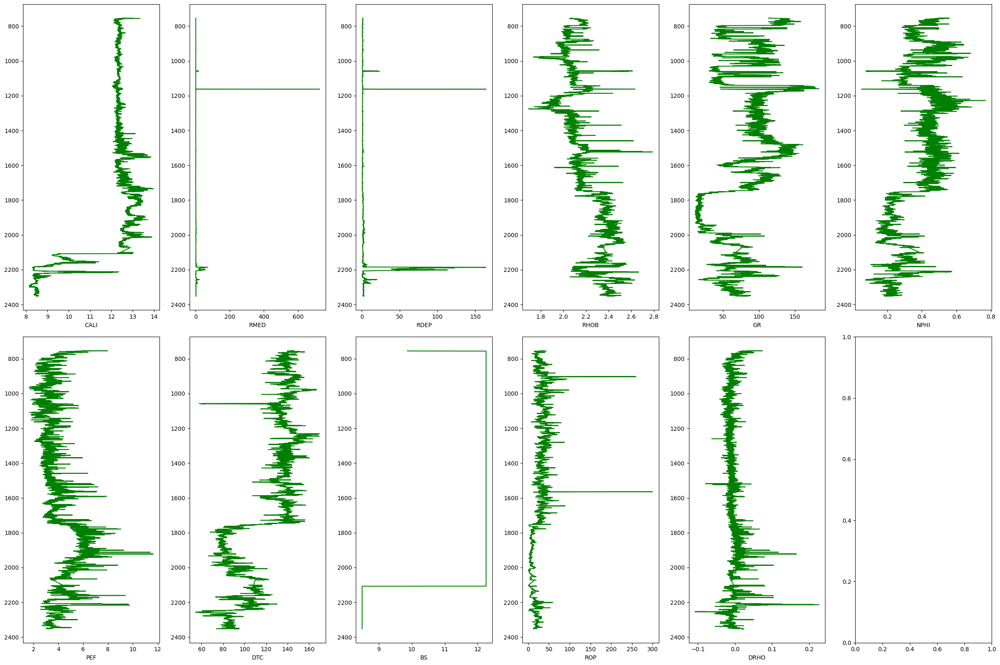

In [52]:
import matplotlib.pyplot as plt

logs = training_dataset.sort_values(by='DEPTH_MD')
features = ['CALI', 'RMED', 'RDEP', 'RHOB', 'GR', 'NPHI', 'PEF', 'DTC', 'BS', 'ROP', 'DRHO']

fig, axs = plt.subplots(nrows=2, ncols=6, figsize=(24, 16))

for i in range(len(features)):
    row = i // 6
    col = i % 6
    axs[row, col].plot(logs[features[i]], logs.DEPTH_MD, '-g')
    axs[row, col].invert_yaxis()
    axs[row, col].set_xlabel(features[i])

plt.tight_layout()
plt.show()


<Axes: xlabel='FACIES'>

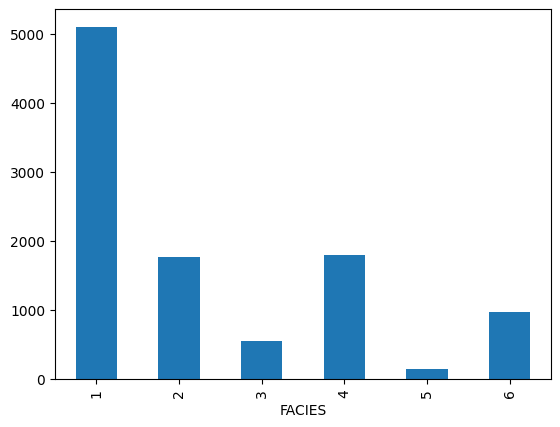

In [53]:
facies_counts = training_dataset['FACIES'].value_counts().sort_index()
facies_counts.plot(kind='bar')

In [54]:
#training_dataset.columns
#dummy = training_dataset.drop(['CALI', 'BS'], axis=1)
#sns.pairplot(dummy, hue='FACIES', palette='Set1')

<Axes: >

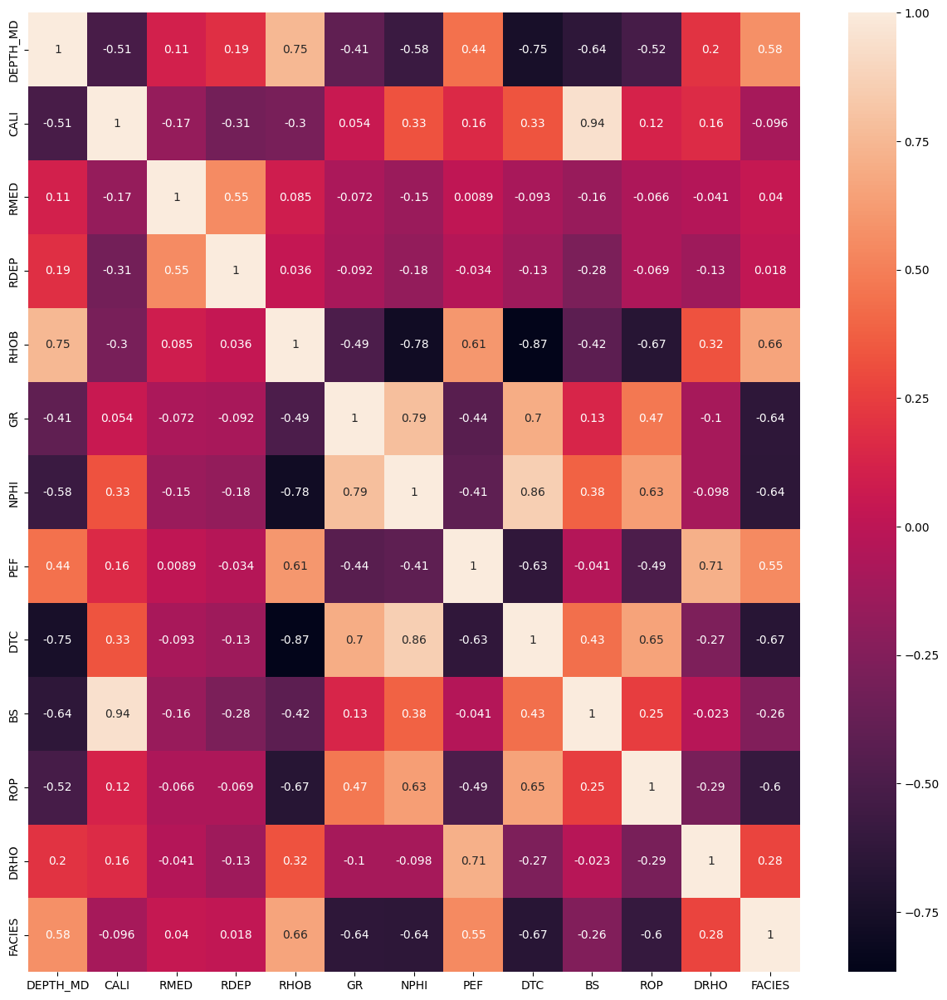

In [55]:
plt.figure(figsize=(15,15))
sns.heatmap(training_dataset.corr(), annot=True)

In [56]:
X = training_dataset.drop(['GR', 'NPHI', 'RDEP','RHOB'], axis=1)
y = training_dataset['FACIES']

In [57]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [58]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# K-Nearst Neighbors

### Hyperparameter Tunning

In [59]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

param_distributions = {'n_neighbors': np.arange(3, 15, 3),
                       'weights': ['uniform', 'distance']}
grid_search = GridSearchCV(KNeighborsClassifier(),
                           param_distributions,
                           scoring='accuracy', cv=10)
grid_search.fit(X_train_scaled, y_train)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([ 3,  6,  9, 12]),
                         'weights': ['uniform', 'distance']},
             scoring='accuracy')

### Model Evaluation on Test Set

In [60]:
knn = grid_search.best_estimator_
knn.fit(X_train_scaled, y_train)
y_pred_knn = knn.predict(X_test_scaled)

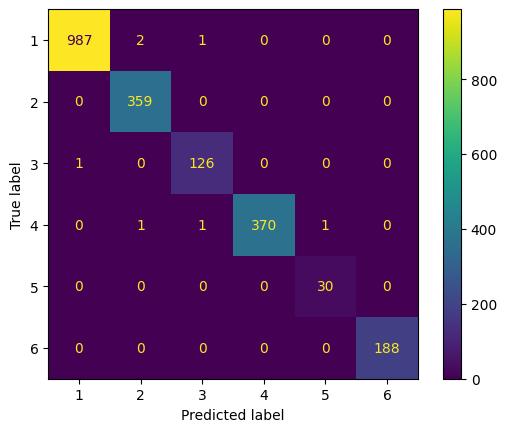

In [61]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred_knn)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=knn.classes_).plot()

In [62]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred_knn))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00       990
           2       0.99      1.00      1.00       359
           3       0.98      0.99      0.99       127
           4       1.00      0.99      1.00       373
           5       0.97      1.00      0.98        30
           6       1.00      1.00      1.00       188

    accuracy                           1.00      2067
   macro avg       0.99      1.00      0.99      2067
weighted avg       1.00      1.00      1.00      2067



# Random Forest Classifier

### Hyperparameter Tunning

In [63]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint
from sklearn.ensemble import RandomForestClassifier

param_distributions = {'n_estimators': sp_randint(100, 200),
                       'max_depth': sp_randint(3, 7),
                       'max_features': sp_randint(1, 7)}
search = RandomizedSearchCV(RandomForestClassifier(),
                           param_distributions,
                           scoring='accuracy', cv=10)
search.fit(X_train_scaled, y_train)

RandomizedSearchCV(cv=10, estimator=RandomForestClassifier(),
                   param_distributions={'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e32cb07ca10>,
                                        'max_features': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e32cb07b230>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e32cb07b2f0>},
                   scoring='accuracy')

In [64]:
search.best_params_

{'max_depth': 6, 'max_features': 4, 'n_estimators': 162}

In [65]:
pd.DataFrame(search.cv_results_).transpose()

,0,1,2,3,4,5,6,7,8,9
mean_fit_time,2.117881,1.300751,1.597044,2.155265,2.002143,1.465644,1.202303,1.947531,1.490533,1.171485
std_fit_time,0.248137,0.146919,0.200939,0.267963,0.19332,0.140174,0.153967,0.234681,0.18872,0.136661
mean_score_time,0.017534,0.014137,0.018069,0.021697,0.017188,0.013066,0.016729,0.020936,0.022509,0.016084
std_score_time,0.004705,0.002182,0.004071,0.005326,0.003293,0.003062,0.002436,0.005077,0.004599,0.003516
param_max_depth,4,6,5,6,3,5,5,3,5,3
param_max_features,6,3,3,4,6,5,2,4,2,3
param_n_estimators,147,112,142,162,162,105,138,187,172,136
params,"{'max_depth': 4, 'max_features': 6, 'n_estimat...","{'max_depth': 6, 'max_features': 3, 'n_estimat...","{'max_depth': 5, 'max_features': 3, 'n_estimat...","{'max_depth': 6, 'max_features': 4, 'n_estimat...","{'max_depth': 3, 'max_features': 6, 'n_estimat...","{'max_depth': 5, 'max_features': 5, 'n_estimat...","{'max_depth': 5, 'max_features': 2, 'n_estimat...","{'max_depth': 3, 'max_features': 4, 'n_estimat...","{'max_depth': 5, 'max_features': 2, 'n_estimat...","{'max_depth': 3, 'max_features': 3, 'n_estimat..."
split0_test_score,1.0,1.0,0.998791,1.0,0.934704,1.0,0.995163,0.943168,0.984281,0.932285
split1_test_score,0.997582,1.0,0.998791,1.0,0.960097,1.0,0.995163,0.94075,0.991536,0.932285


### Model Evaluation on Test Set

In [66]:
rf = search.best_estimator_
rf.fit(X_train_scaled, y_train)
y_pred_rf = rf.predict(X_test_scaled)

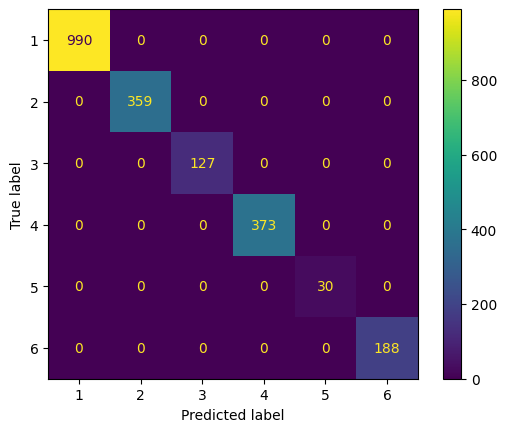

In [67]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=rf.classes_).plot()

In [68]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00       990
           2       1.00      1.00      1.00       359
           3       1.00      1.00      1.00       127
           4       1.00      1.00      1.00       373
           5       1.00      1.00      1.00        30
           6       1.00      1.00      1.00       188

    accuracy                           1.00      2067
   macro avg       1.00      1.00      1.00      2067
weighted avg       1.00      1.00      1.00      2067



# SVM

### Model Evaluation on Test Set

In [69]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

param_distributions = {'C': [1, 5, 10],
                       'kernel': ('linear', 'rbf'),
                       'gamma' : ('scale', 'auto')}

grid_search = GridSearchCV(SVC(),
                           param_grid=param_distributions,
                           scoring='accuracy',
                           cv=10)
grid_search.fit(X_train_scaled, y_train)

GridSearchCV(cv=10, estimator=SVC(),
             param_grid={'C': [1, 5, 10], 'gamma': ('scale', 'auto'),
                         'kernel': ('linear', 'rbf')},
             scoring='accuracy')

In [70]:
svm = grid_search.best_estimator_
svm.fit(X_train_scaled, y_train)
y_pred_svm = svm.predict(X_test_scaled)

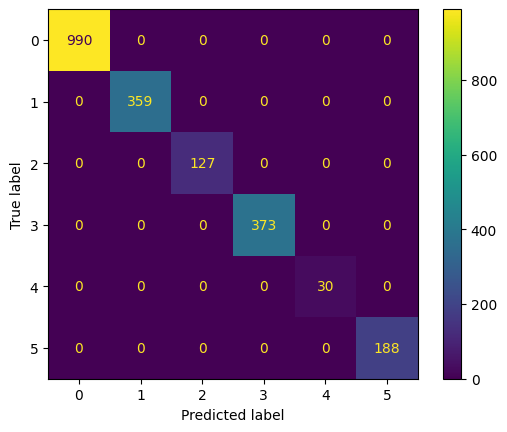

In [71]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred_svm)
ConfusionMatrixDisplay(cm).plot()

In [72]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred_svm))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00       990
           2       1.00      1.00      1.00       359
           3       1.00      1.00      1.00       127
           4       1.00      1.00      1.00       373
           5       1.00      1.00      1.00        30
           6       1.00      1.00      1.00       188

    accuracy                           1.00      2067
   macro avg       1.00      1.00      1.00      2067
weighted avg       1.00      1.00      1.00      2067



# Evaluation on Blind Set

In [73]:
y_blind1 = blind_dataset1['FACIES']
X_blind1 = blind_dataset1.drop(['GR', 'NPHI', 'RDEP','RHOB'], axis=1)
X_blind_scaled1 = scaler.transform(X_blind1)

In [74]:
y_blind2 = blind_dataset2['FACIES']
X_blind2 = blind_dataset2.drop(['GR', 'NPHI', 'RDEP','RHOB'], axis=1)
X_blind_scaled2 = scaler.transform(X_blind2)

In [75]:
y_blind_knn1 = knn.predict(X_blind_scaled1)
y_blind_knn2 = knn.predict(X_blind_scaled2)
y_blind_rf1 = rf.predict(X_blind_scaled1)
y_blind_rf2 = rf.predict(X_blind_scaled2)

### K-Nearst Neighbors

#### Dataset B

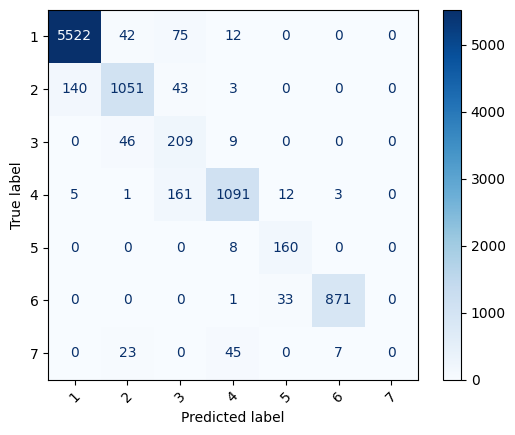

In [78]:
cm = confusion_matrix(y_blind1, y_blind_knn1)
labels = np.unique(y_blind1)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(cmap="Blues", xticks_rotation=45)

In [79]:
print(classification_report(y_blind1, y_blind_knn1))

              precision    recall  f1-score   support

           1       0.97      0.98      0.98      5651
           2       0.90      0.85      0.88      1237
           3       0.43      0.79      0.56       264
           4       0.93      0.86      0.89      1273
           5       0.78      0.95      0.86       168
           6       0.99      0.96      0.98       905
           7       0.00      0.00      0.00        75

    accuracy                           0.93      9573
   macro avg       0.72      0.77      0.73      9573
weighted avg       0.94      0.93      0.93      9573



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


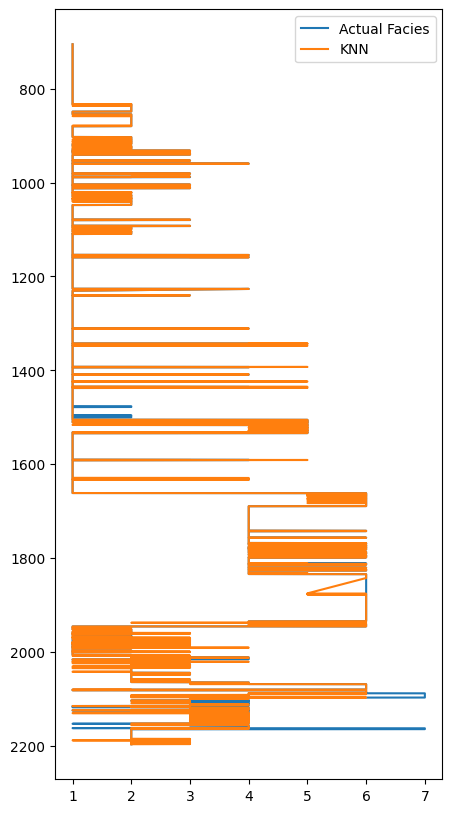

In [80]:
figure, ax = plt.subplots(figsize=(5,10))
logs = blind_dataset1.sort_values(by='DEPTH_MD')
ax.plot(logs.FACIES, logs.DEPTH_MD, label='Actual Facies')
ax.plot(y_blind_knn1, logs.DEPTH_MD, label='KNN')
ax.invert_yaxis()
ax.legend()

#### Dataset C

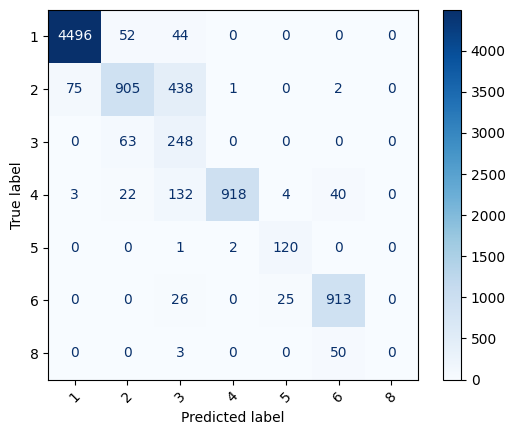

In [84]:
cm = confusion_matrix(y_blind2, y_blind_knn2)
labels = np.unique(np.concatenate((y_blind2, y_blind_knn2)))

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(cmap="Blues", xticks_rotation=45)

In [ ]:
print(classification_report(y_blind2, y_blind_knn2))

In [ ]:
figure, ax = plt.subplots(figsize=(5,10))
logs = blind_dataset2.sort_values(by='DEPTH_MD')
ax.plot(logs.FACIES, logs.DEPTH_MD, label='Actual Facies')
ax.plot(y_blind_knn2, logs.DEPTH_MD, label='KNN')
ax.invert_yaxis()
ax.legend()

### Random Forest Classifier

#### Dataset B

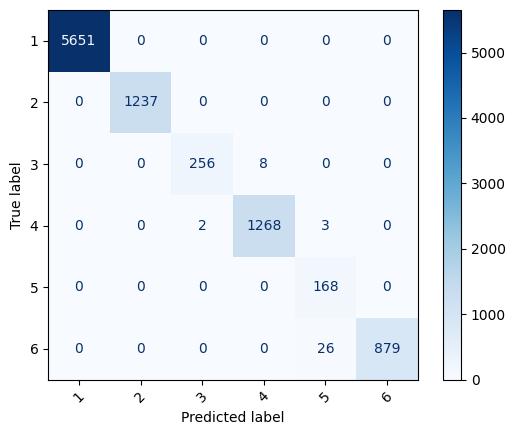

In [86]:
cm = confusion_matrix(y_blind1, y_blind_rf1, labels=rf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=rf.classes_)
disp.plot(cmap="Blues", xticks_rotation=45)

In [87]:
print(classification_report(y_blind1, y_blind_rf1))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00      5651
           2       1.00      1.00      1.00      1237
           3       0.99      0.97      0.98       264
           4       0.99      1.00      0.99      1273
           5       0.85      1.00      0.92       168
           6       0.92      0.97      0.95       905
           7       0.00      0.00      0.00        75

    accuracy                           0.99      9573
   macro avg       0.82      0.85      0.83      9573
weighted avg       0.98      0.99      0.98      9573



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


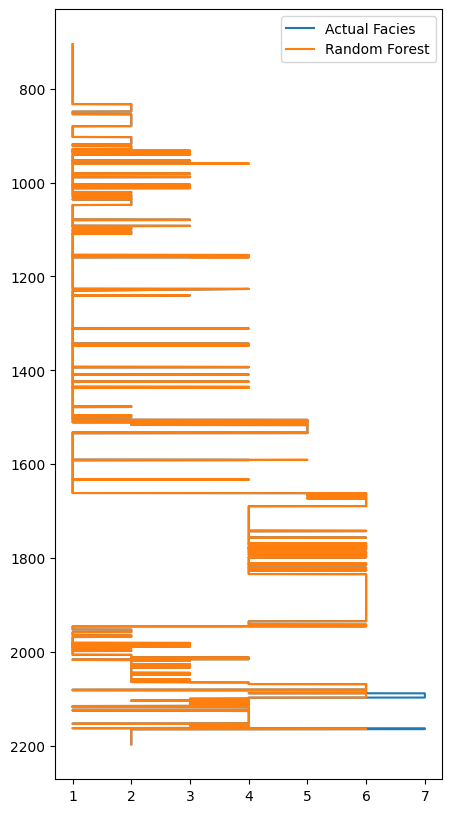

In [88]:
figure, ax = plt.subplots(figsize=(5,10))
logs = blind_dataset1.sort_values(by='DEPTH_MD')
ax.plot(logs.FACIES, logs.DEPTH_MD, label='Actual Facies')
ax.plot(y_blind_rf1, logs.DEPTH_MD, label='Random Forest')
ax.invert_yaxis()
ax.legend()

#### Dataset C

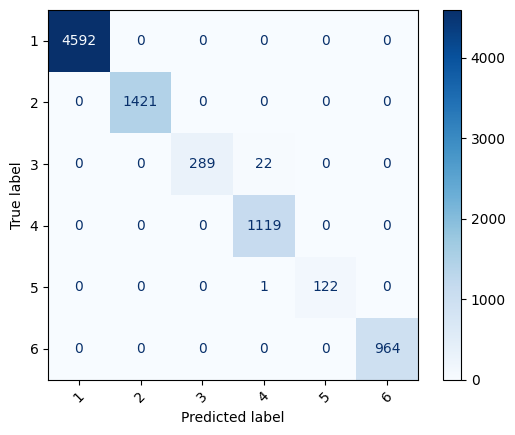

In [90]:
cm = confusion_matrix(y_blind2, y_blind_rf2, labels=rf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=rf.classes_)
disp.plot(cmap="Blues", xticks_rotation=45)

In [91]:
print(classification_report(y_blind2, y_blind_rf2))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00      4592
           2       1.00      1.00      1.00      1421
           3       1.00      0.93      0.96       311
           4       0.98      1.00      0.99      1119
           5       1.00      0.99      1.00       123
           6       0.95      1.00      0.97       964
           8       0.00      0.00      0.00        53

    accuracy                           0.99      8583
   macro avg       0.85      0.85      0.85      8583
weighted avg       0.99      0.99      0.99      8583



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


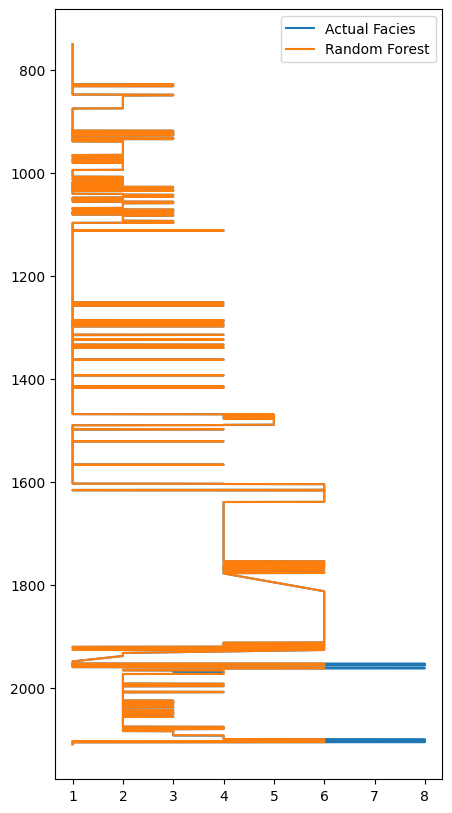

In [92]:
figure, ax = plt.subplots(figsize=(5,10))
logs = blind_dataset2.sort_values(by='DEPTH_MD')
ax.plot(logs.FACIES, logs.DEPTH_MD, label='Actual Facies')
ax.plot(y_blind_rf2, logs.DEPTH_MD, label='Random Forest')
ax.invert_yaxis()
ax.legend()

### SVM

#### Dataset B

In [93]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

param_distributions = {'C': [1, 5, 10],
                       'kernel': ('linear', 'rbf'),
                       'gamma' : ('scale', 'auto')}

grid_search = GridSearchCV(SVC(),
                           param_grid=param_distributions,
                           scoring='accuracy',
                           cv=10)
grid_search.fit(X_blind_scaled1, y_blind1)

GridSearchCV(cv=10, estimator=SVC(),
             param_grid={'C': [1, 5, 10], 'gamma': ('scale', 'auto'),
                         'kernel': ('linear', 'rbf')},
             scoring='accuracy')

In [94]:
svm1 = grid_search.best_estimator_
svm1.fit(X_blind_scaled1, y_blind1)
y_pred_svm1 = svm.predict(X_blind_scaled1)

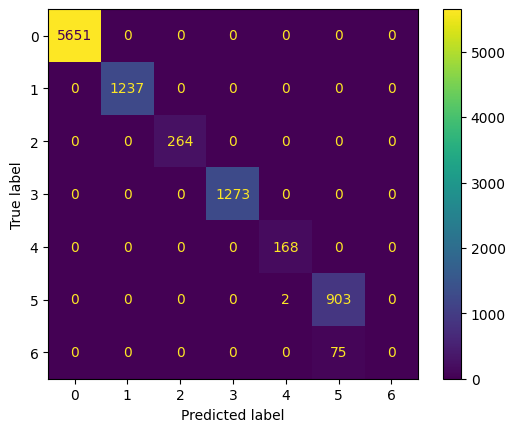

In [95]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

cm1 = confusion_matrix(y_blind1, y_pred_svm1)
ConfusionMatrixDisplay(cm1).plot()

In [96]:
from sklearn.metrics import classification_report

print(classification_report(y_blind1, y_pred_svm1))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00      5651
           2       1.00      1.00      1.00      1237
           3       1.00      1.00      1.00       264
           4       1.00      1.00      1.00      1273
           5       0.99      1.00      0.99       168
           6       0.92      1.00      0.96       905
           7       0.00      0.00      0.00        75

    accuracy                           0.99      9573
   macro avg       0.84      0.86      0.85      9573
weighted avg       0.98      0.99      0.99      9573



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


#### Dataset C

In [97]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

param_distributions = {'C': [1, 5, 10],
                       'kernel': ('linear', 'rbf'),
                       'gamma' : ('scale', 'auto')}

grid_search = GridSearchCV(SVC(),
                           param_grid=param_distributions,
                           scoring='accuracy',
                           cv=10)
grid_search.fit(X_blind_scaled2, y_blind2)

GridSearchCV(cv=10, estimator=SVC(),
             param_grid={'C': [1, 5, 10], 'gamma': ('scale', 'auto'),
                         'kernel': ('linear', 'rbf')},
             scoring='accuracy')

In [98]:
svm2 = grid_search.best_estimator_
svm2.fit(X_blind_scaled2, y_blind2)
y_pred_svm2 = svm.predict(X_blind_scaled2)

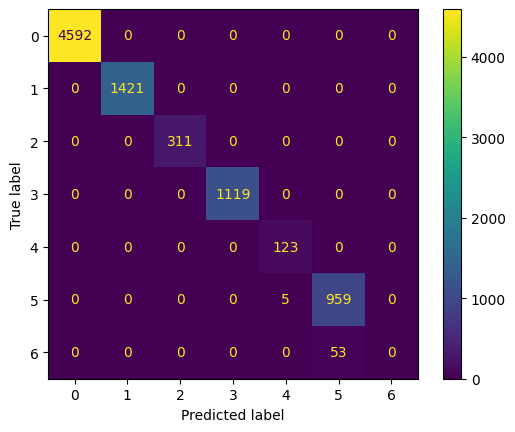

In [99]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

cm2 = confusion_matrix(y_blind2, y_pred_svm2)
ConfusionMatrixDisplay(cm2).plot()

In [100]:
from sklearn.metrics import classification_report

print(classification_report(y_blind2, y_pred_svm2))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00      4592
           2       1.00      1.00      1.00      1421
           3       1.00      1.00      1.00       311
           4       1.00      1.00      1.00      1119
           5       0.96      1.00      0.98       123
           6       0.95      0.99      0.97       964
           8       0.00      0.00      0.00        53

    accuracy                           0.99      8583
   macro avg       0.84      0.86      0.85      8583
weighted avg       0.99      0.99      0.99      8583



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# CLUSTERING

## Dataset A

In [101]:
import pandas as pd
from scipy import stats
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn import preprocessing
import pylab as pl
import numpy as np
%matplotlib inline

In [102]:
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()
datasetA_scaled= scaler.fit(datasetA)
datasetA_scaled= scaler.transform(datasetA)
datasetA_scaled= pd.DataFrame(datasetA_scaled, columns=datasetA.columns)

In [103]:
datasetA_scaled.head()

,DEPTH_MD,CALI,RMED,RDEP,RHOB,GR,NPHI,PEF,DTC,BS,ROP,DRHO,FACIES
0,-1.716990,0.397548,-0.063382,-0.121929,-0.664438,1.018974,1.083702,1.520588,0.883964,-1.311937,0.488137,2.207691,-0.795841
1,-1.716660,0.476736,-0.064929,-0.121996,-0.677210,0.967436,1.138209,1.902280,0.886847,-1.311937,0.464790,2.647532,-0.795841
2,-1.716329,0.546347,-0.065336,-0.121137,-0.682806,1.049201,1.306717,2.449009,0.883000,-1.311937,0.356551,3.494194,-0.795841
3,-1.715999,0.643740,-0.063009,-0.119717,-0.670003,1.097787,1.508273,3.062143,0.897018,-1.311937,0.336663,4.549232,-0.795841
4,-1.715668,0.675671,-0.065919,-0.122635,-0.662489,1.113202,1.615431,3.168177,0.955646,-1.311937,0.479640,4.655367,-0.795841


In [104]:
datasetA.columns

Index(['DEPTH_MD', 'CALI', 'RMED', 'RDEP', 'RHOB', 'GR', 'NPHI', 'PEF', 'DTC',
       'BS', 'ROP', 'DRHO', 'FACIES'],
      dtype='object')

<Axes: >

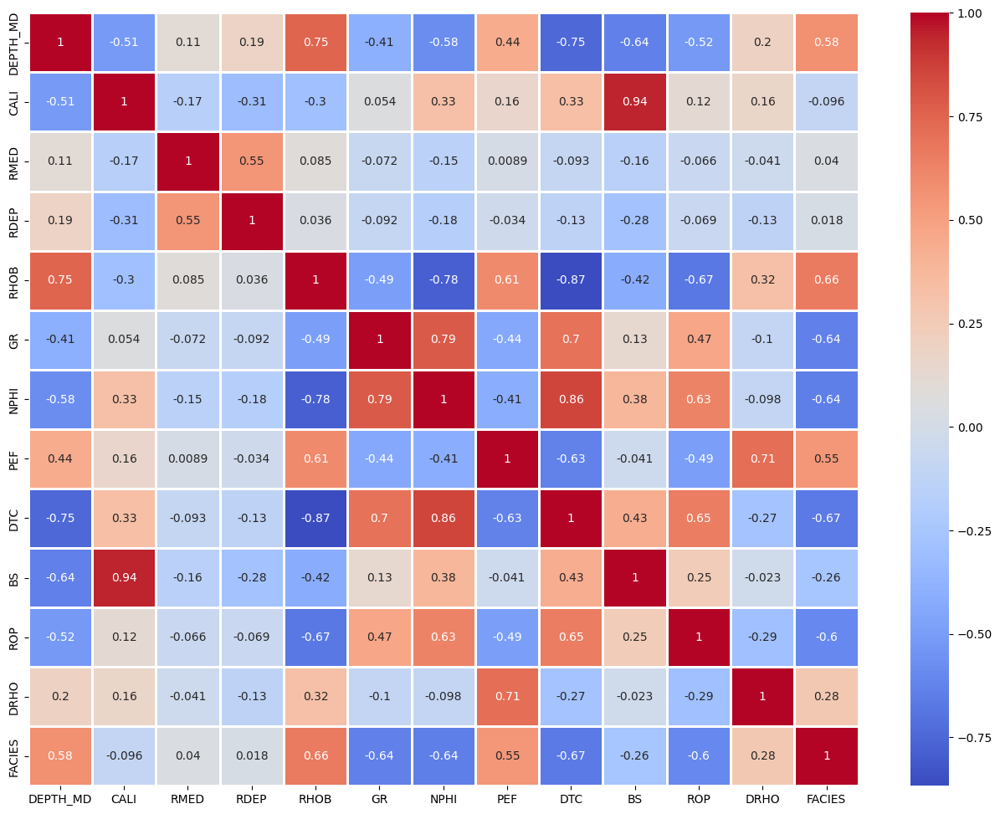

In [105]:
fig=plt.figure(figsize=(16,12))
sns.heatmap(datasetA_scaled.corr(), annot=True, cmap='coolwarm',linewidths=2,linecolor='white')

In [106]:
from numpy.core.numeric import indices
from sklearn.neighbors import NearestNeighbors
Neighbors = NearestNeighbors(n_neighbors=6)
nbrs = Neighbors.fit(datasetA_scaled)
distances, indices=nbrs.kneighbors(datasetA_scaled)

/tmp/ipython-input-3874450595.py:1: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric.indices.
  from numpy.core.numeric import indices


In [107]:
distances

array([[0.        , 0.59309901, 1.0536024 , 1.08552032, 1.11349406,
        1.14943153],
       [0.        , 0.59309901, 0.71934883, 0.7617294 , 0.78668845,
        0.94477043],
       [0.        , 0.4310592 , 0.44220819, 0.56960673, 0.63697749,
        0.88612974],
       ...,
       [0.        , 0.42780057, 0.64065647, 0.76919802, 0.85512322,
        0.91865267],
       [0.        , 0.35962981, 0.64065647, 0.69876678, 0.78806419,
        0.79489801],
       [0.        , 0.35962981, 0.49424068, 0.62169189, 0.67199819,
        0.7105542 ]])

In [108]:
indices

array([[    0,     1,    12,    11,     9,    10],
       [    1,     0,     9,    10,    11,     8],
       [    2,     6,     7,     8,     5,     9],
       ...,
       [10328, 10327, 10329, 10330, 10326, 10299],
       [10329, 10330, 10328, 10299, 10212, 10327],
       [10330, 10329, 10299, 10298, 10322, 10321]])

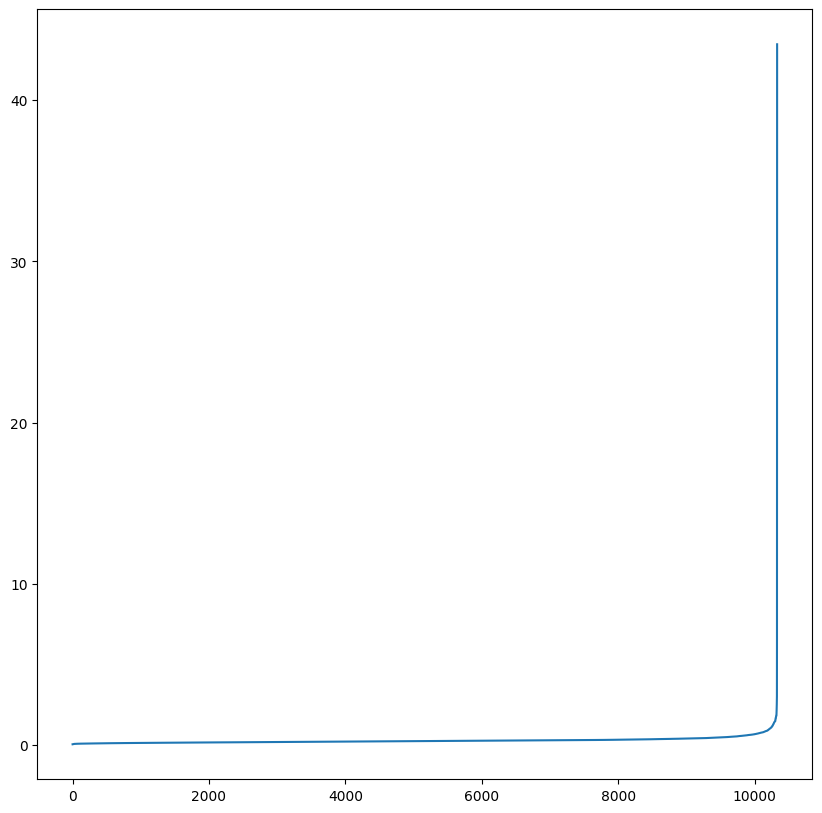

In [109]:
fig = plt.figure(figsize=(10,10))
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

### Simple DBScan

In [110]:
from sklearn.cluster import DBSCAN

model = DBSCAN(eps=0.3, min_samples=6)
result = model.fit_predict(datasetA_scaled)

In [111]:
pd.DataFrame(result).value_counts()

,count
0,
-1,6709
70,1028
36,287
15,223
61,204
...,...
63,5
20,4
6,4


In [112]:
from sklearn.metrics import silhouette_score

silhouette_score(datasetA_scaled, result)

np.float64(-0.45082700455684505)

In [113]:
labels = model.labels_
n_cluster = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = list(labels).count(-1)

In [114]:
n_noise

6709

In [115]:
n_cluster

104

### Hyperparameter Tunning

In [116]:
eps_range = np.linspace(0.2, 0.5, 5)
sample_range = np.arange(4, 15, 2)
tuning = []
for i in range(len(eps_range)):
  for j in range(len(sample_range)):
    dummy = []
    model = DBSCAN(eps=eps_range[i], min_samples=sample_range[j])
    result = model.fit_predict(datasetA_scaled)
    score = silhouette_score(datasetA_scaled, result)
    labels = model.labels_
    n_cluster = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise = list(labels).count(-1)
    dummy.append(eps_range[i])
    dummy.append(sample_range[j])
    dummy.append(score)
    dummy.append(n_cluster)
    dummy.append(n_noise)
    tuning.append(dummy)

In [117]:
tuning_result = pd.DataFrame(tuning, columns=['eps', 'min_samples', 'silhouette_score', 'n_cluster', 'n_noise'])
tuning_result.sort_values(by=['silhouette_score'])

,eps,min_samples,silhouette_score,n_cluster,n_noise
0,0.200,4,-0.599952,171,8823
1,0.200,6,-0.583515,41,9630
9,0.275,10,-0.548240,32,8930
8,0.275,8,-0.530513,59,8399
10,0.275,12,-0.527953,17,9256
7,0.275,6,-0.488360,98,7623
6,0.275,4,-0.429493,291,5972
17,0.350,14,-0.377669,31,7286
15,0.350,10,-0.354294,35,6536
11,0.275,14,-0.345230,13,9423


<Axes: xlabel='min_samples', ylabel='eps'>

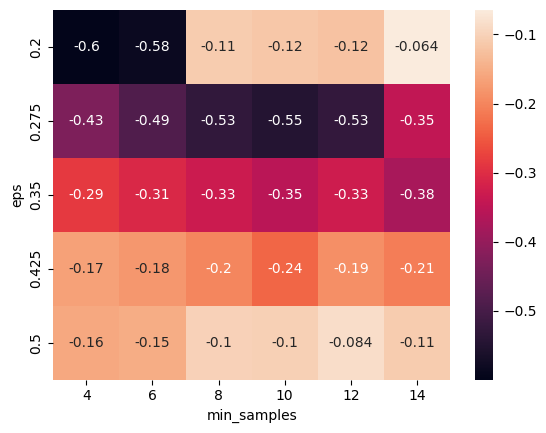

In [118]:
tuning_pivot = tuning_result.pivot(index='eps', columns='min_samples', values='silhouette_score')
sns.heatmap(tuning_pivot, annot=True)

### Final Clustering

In [119]:
model = DBSCAN(eps=0.425, min_samples=10)
result = model.fit_predict(datasetA_scaled)
datasetA['cluster'] = result

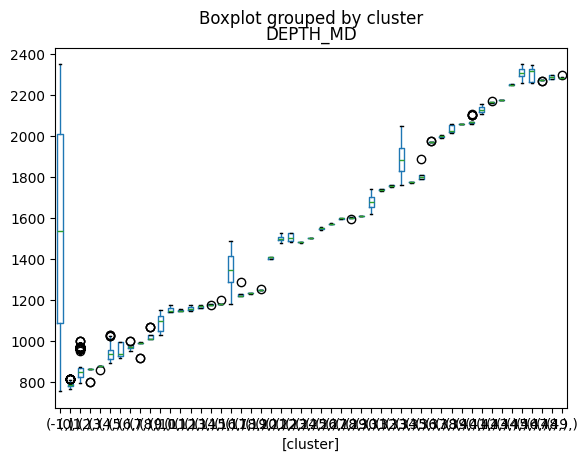

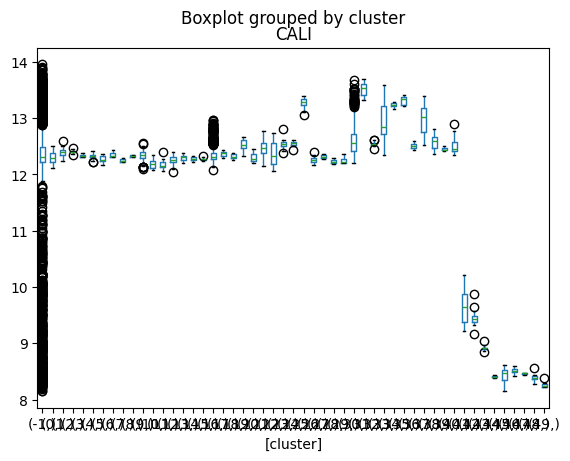

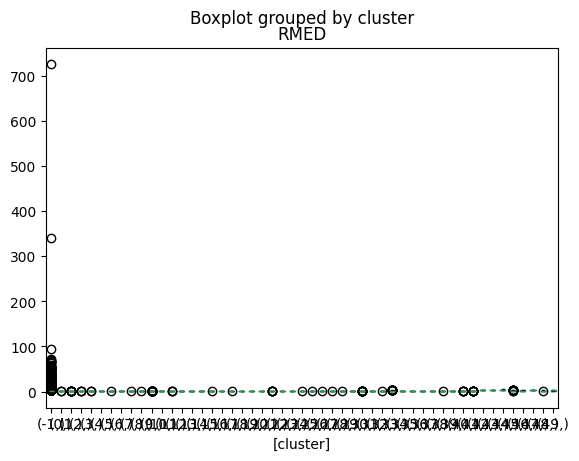

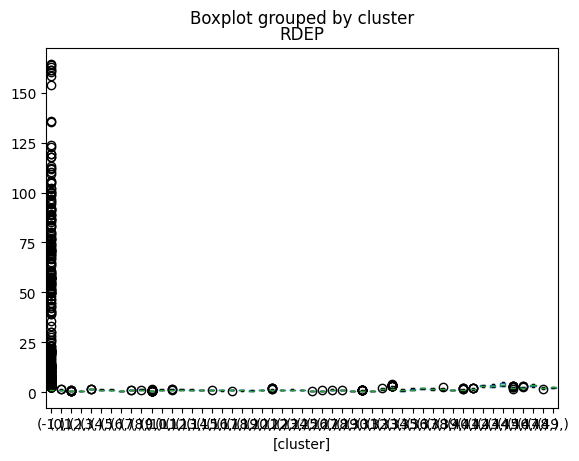

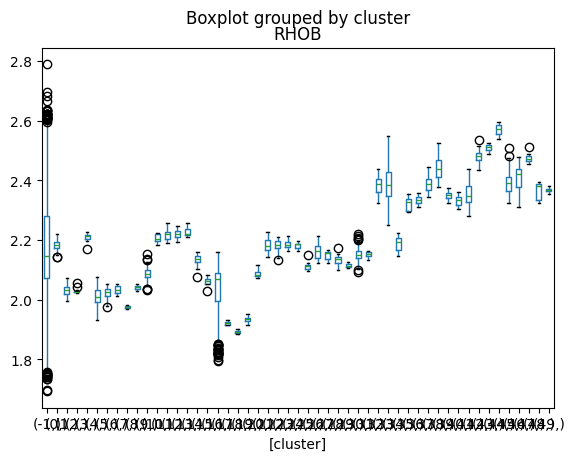

...

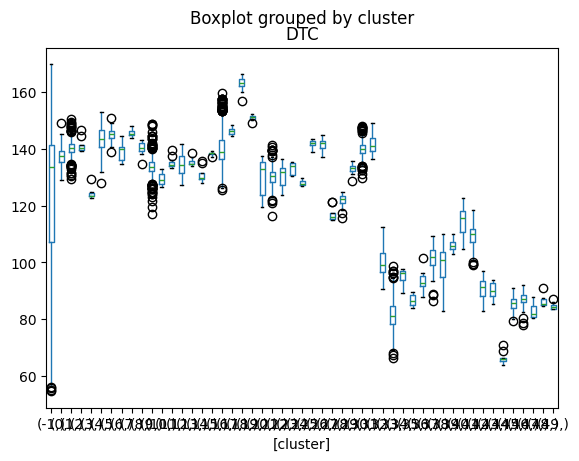

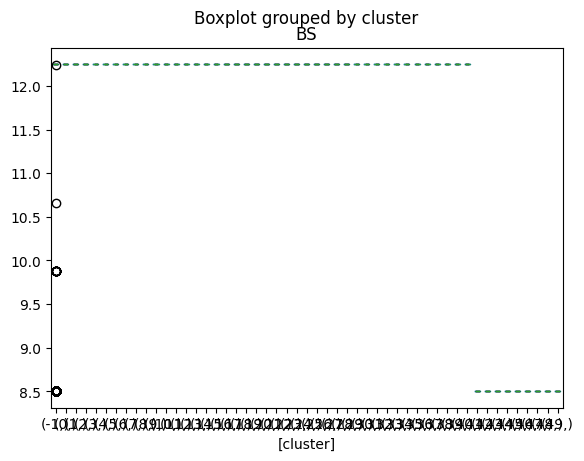

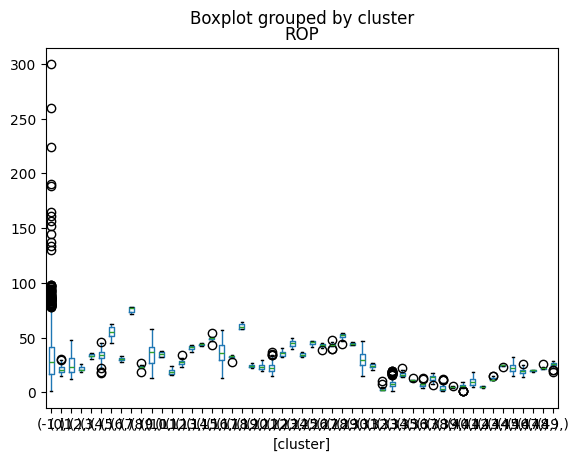

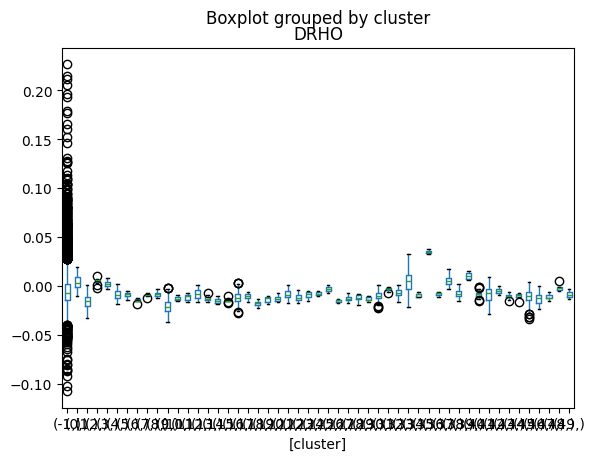

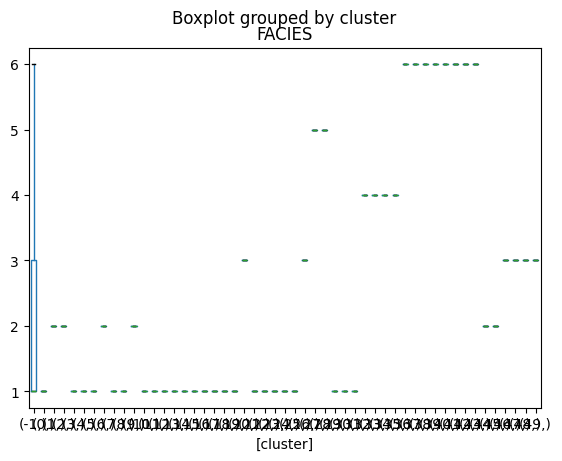

In [120]:
for i in range((len(datasetA.columns)-1)):
  datasetA.boxplot(column=[datasetA.columns[i]], by=['cluster'], grid=False)

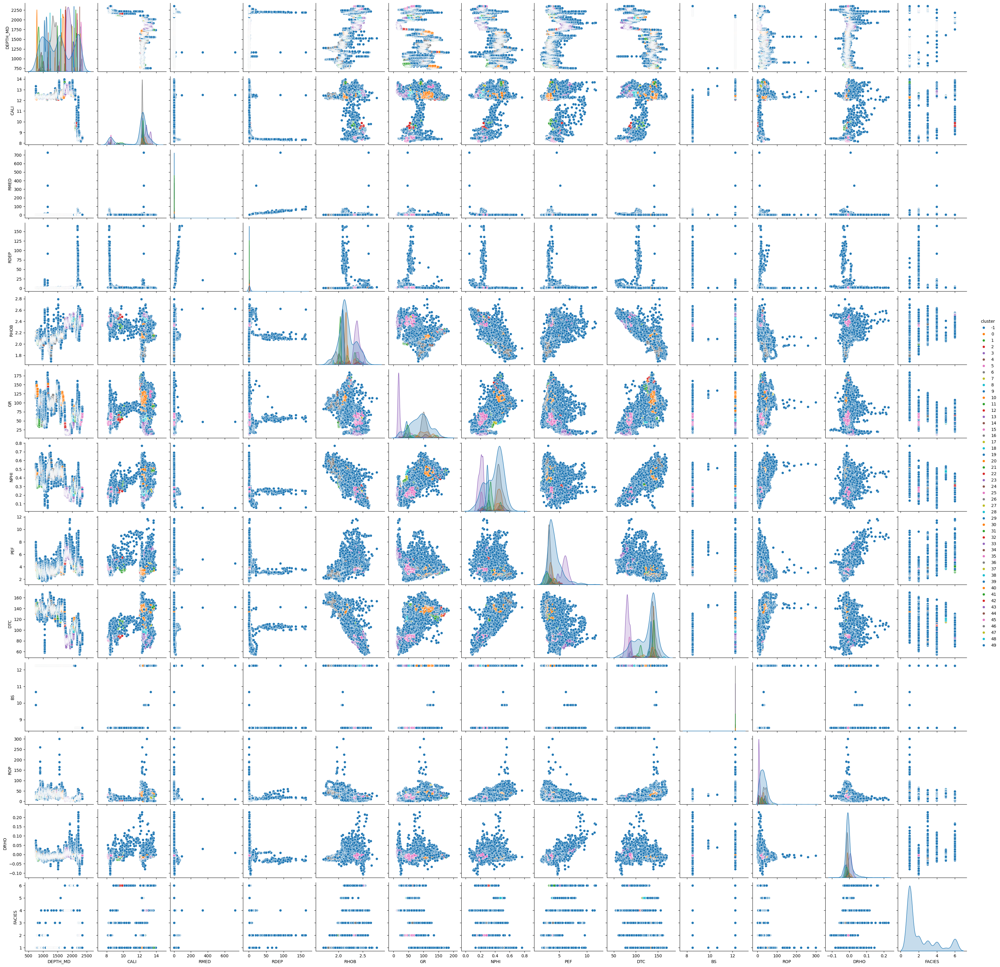

In [121]:
import seaborn as sns

sns.pairplot(datasetA, hue='cluster', palette='tab10')

## Dataset B

In [122]:
import pandas as pd
from scipy import stats
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn import preprocessing
import pylab as pl
import numpy as np
%matplotlib inline

In [123]:
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()
datasetB_scaled= scaler.fit(datasetB)
datasetB_scaled= scaler.transform(datasetB)
datasetB_scaled= pd.DataFrame(datasetB_scaled, columns=datasetB.columns)

In [124]:
datasetB_scaled.head()

,DEPTH_MD,CALI,RMED,RDEP,RHOB,GR,NPHI,PEF,DTC,BS,ROP,DRHO,FACIES
0,-1.708724,0.793896,-0.042298,-0.038990,-0.454589,1.198410,0.709875,-0.242370,1.126926,-1.000914,1.520118,-0.181857,-0.678909
1,-1.708372,0.647836,-0.042124,-0.038930,-0.447939,1.312595,0.739384,-0.435942,1.100042,-1.000914,0.226229,-0.337540,-0.678909
2,-1.708019,0.609784,-0.041681,-0.038512,-0.424045,1.470898,0.602168,-0.481112,1.071521,-1.000914,0.035012,-0.324356,-0.678909
3,-1.707667,0.579761,-0.041185,-0.038507,-0.371313,1.427626,0.487569,-0.517451,1.041744,-0.591444,-0.231791,-0.215802,-0.678909
4,-1.707314,0.540094,-0.040386,-0.037454,-0.313029,1.238862,0.362884,-0.667603,1.018875,0.530165,-0.376755,-0.236932,-0.678909


<Axes: >

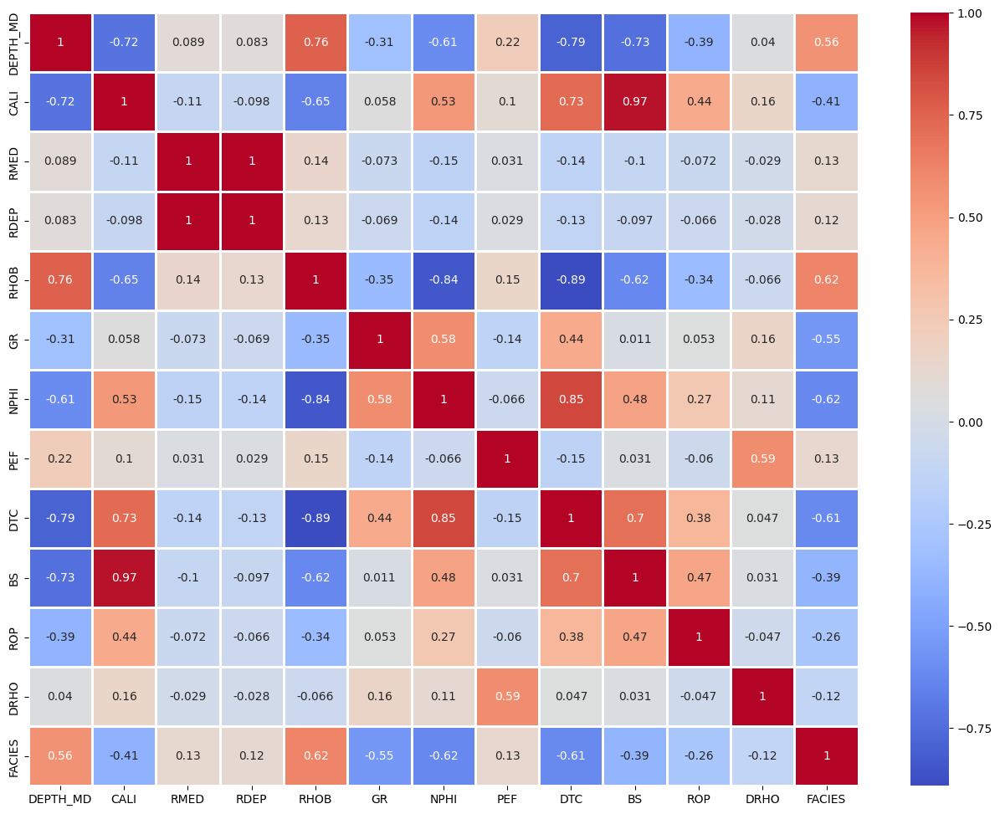

In [125]:
fig=plt.figure(figsize=(16,12))
sns.heatmap(datasetB_scaled.corr(), annot=True, cmap='coolwarm',linewidths=2,linecolor='white')

In [126]:
from numpy.core.numeric import indices
from sklearn.neighbors import NearestNeighbors
Neighbors = NearestNeighbors(n_neighbors=6)
nbrsB = Neighbors.fit(datasetB_scaled)
distances, indices=nbrsB.kneighbors(datasetB_scaled)

/tmp/ipython-input-221245222.py:1: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric.indices.
  from numpy.core.numeric import indices


In [127]:
distances

array([[0.        , 1.33111397, 1.5513198 , 1.61219532, 1.62974734,
        1.66298665],
       [0.        , 0.29240176, 0.69961428, 1.33111397, 1.58739312,
        1.60362234],
       [0.        , 0.29240176, 0.52108369, 1.5513198 , 1.60558611,
        1.60919251],
       ...,
       [0.        , 0.12520505, 0.184356  , 0.21560106, 0.21641794,
        0.23478323],
       [0.        , 0.12520505, 0.19736212, 0.2206482 , 0.23687399,
        0.25784585],
       [0.        , 0.184356  , 0.22930535, 0.23371361, 0.2337298 ,
        0.26831973]])

In [128]:
indices

array([[   0,    1,    2,  679,  678,  249],
       [   1,    2,    3,    0,  429,  428],
       [   2,    1,    3,    0,  429,  428],
       ...,
       [9570, 9571, 9572, 9558, 9557, 9559],
       [9571, 9570, 9557, 9558, 9536, 9535],
       [9572, 9570, 9556, 9559, 9536, 9571]])

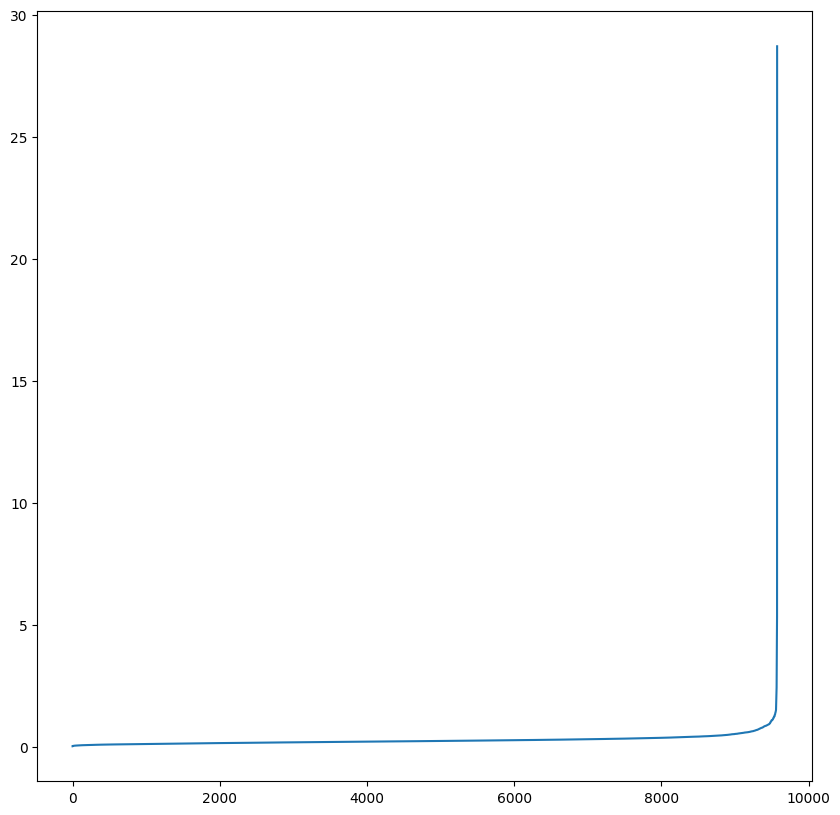

In [129]:
fig = plt.figure(figsize=(10,10))
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

### Simple DBScan

In [130]:
from sklearn.cluster import DBSCAN

modelB = DBSCAN(eps=0.3, min_samples=6)
resultB = modelB.fit_predict(datasetB_scaled)

In [131]:
pd.DataFrame(resultB).value_counts()

,count
0,
-1,7213
40,323
93,236
17,142
123,114
...,...
73,5
33,4
44,4


In [132]:
from sklearn.metrics import silhouette_score

silhouette_score(datasetB_scaled, resultB)

np.float64(-0.47116383736698775)

In [133]:
labelsB = modelB.labels_
n_clusterB = len(set(labelsB)) - (1 if -1 in labelsB else 0)
n_noiseB = list(labelsB).count(-1)

In [134]:
n_clusterB

126

In [135]:
n_noiseB

7213

### Hyperparameter Tunning

In [136]:
eps_rangeB = np.linspace(0.2, 0.5, 5)
sample_rangeB = np.arange(4, 15, 2)
tuningB = []
for i in range(len(eps_rangeB)):
  for j in range(len(sample_rangeB)):
    dummyB = []
    modelB = DBSCAN(eps=eps_rangeB[i], min_samples=sample_rangeB[j])
    resultB = modelB.fit_predict(datasetB_scaled)
    scoreB = silhouette_score(datasetB_scaled, resultB)
    labelsB = modelB.labels_
    n_clusterB = len(set(labelsB)) - (1 if -1 in labelsB else 0)
    n_noiseB = list(labelsB).count(-1)
    dummyB.append(eps_rangeB[i])
    dummyB.append(sample_rangeB[j])
    dummyB.append(scoreB)
    dummyB.append(n_clusterB)
    dummyB.append(n_noiseB)
    tuningB.append(dummyB)

In [137]:
tuning_resultB = pd.DataFrame(tuning, columns=['eps', 'min_samples', 'silhouette_score', 'n_cluster', 'n_noise'])
tuning_resultB.sort_values(by=['silhouette_score'])

,eps,min_samples,silhouette_score,n_cluster,n_noise
0,0.200,4,-0.599952,171,8823
1,0.200,6,-0.583515,41,9630
9,0.275,10,-0.548240,32,8930
8,0.275,8,-0.530513,59,8399
10,0.275,12,-0.527953,17,9256
7,0.275,6,-0.488360,98,7623
6,0.275,4,-0.429493,291,5972
17,0.350,14,-0.377669,31,7286
15,0.350,10,-0.354294,35,6536
11,0.275,14,-0.345230,13,9423


<Axes: xlabel='min_samples', ylabel='eps'>

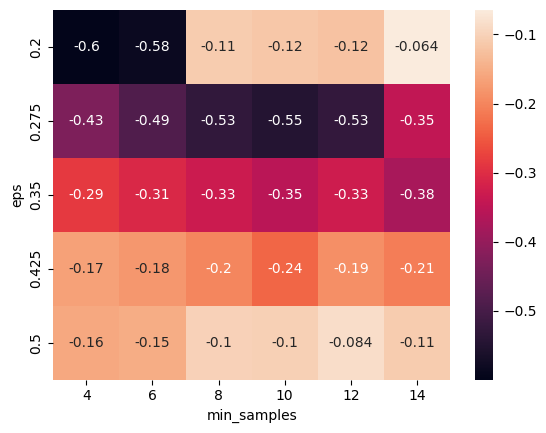

In [138]:
tuning_pivotB = tuning_resultB.pivot(index='eps', columns='min_samples', values='silhouette_score')
sns.heatmap(tuning_pivotB, annot=True)

### Final Clustering

In [139]:
modelB = DBSCAN(eps=0.425, min_samples=10)
resultB = modelB.fit_predict(datasetB_scaled)
datasetB['cluster'] = resultB

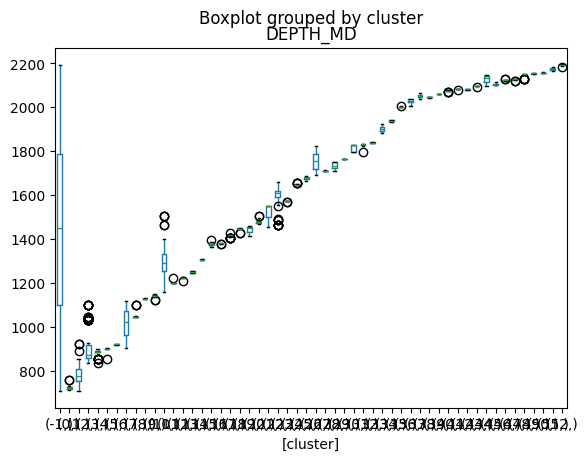

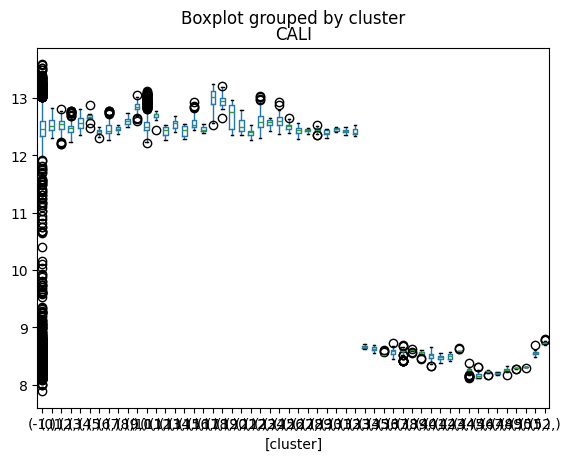

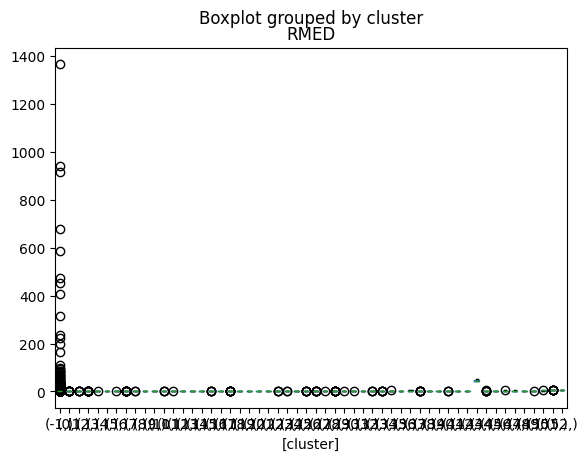

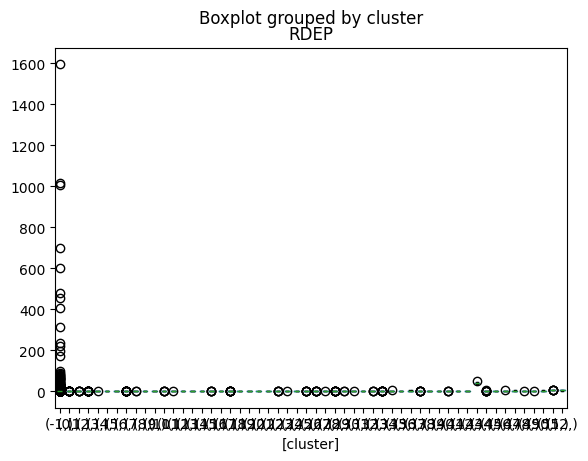

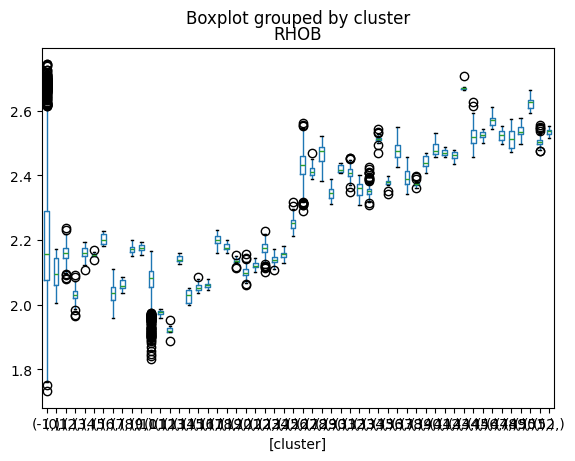

...

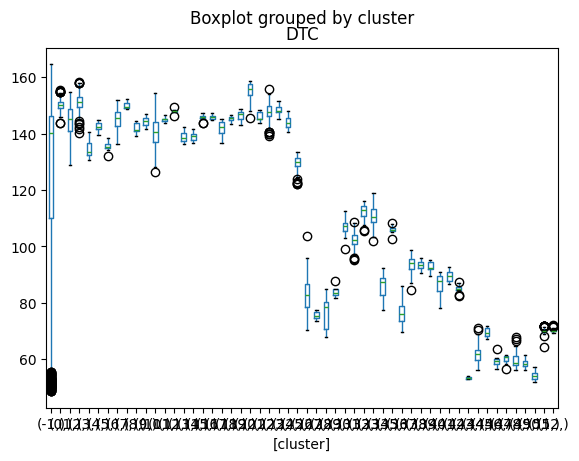

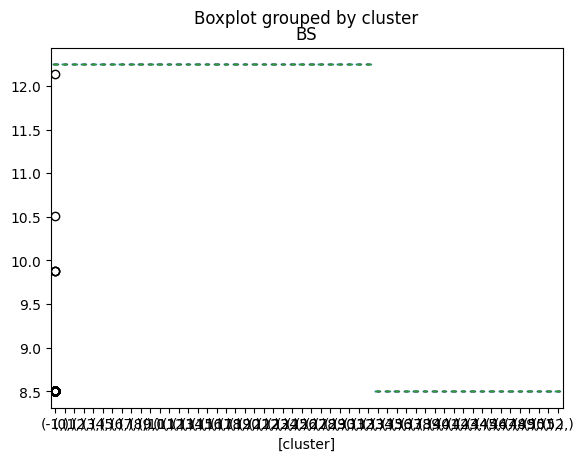

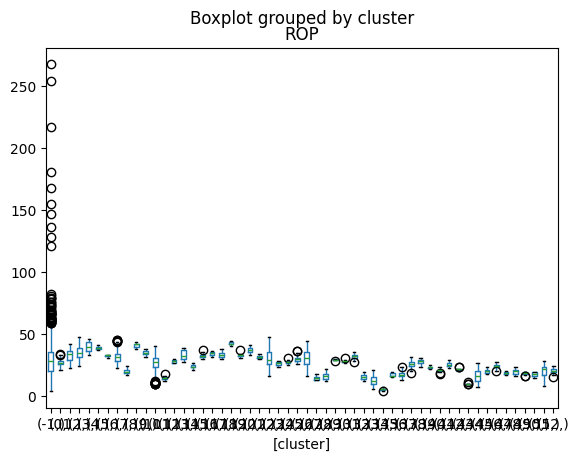

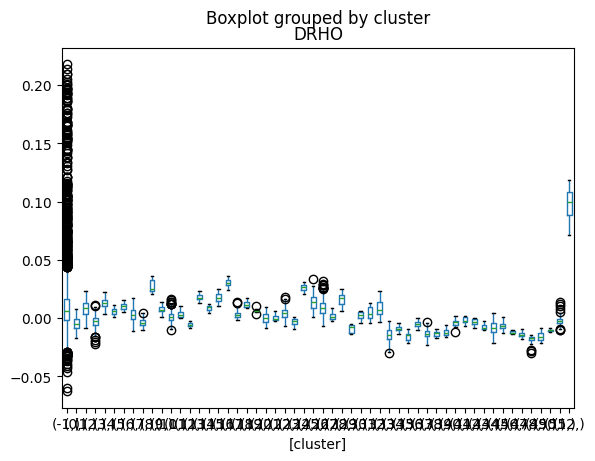

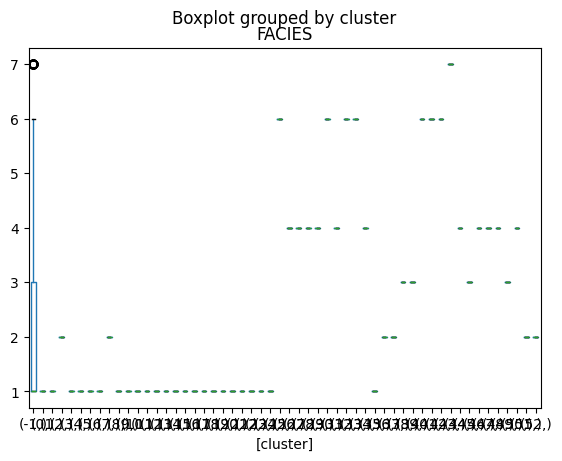

In [140]:
for i in range((len(datasetB.columns)-1)):
  datasetB.boxplot(column=[datasetB.columns[i]], by=['cluster'], grid=False)

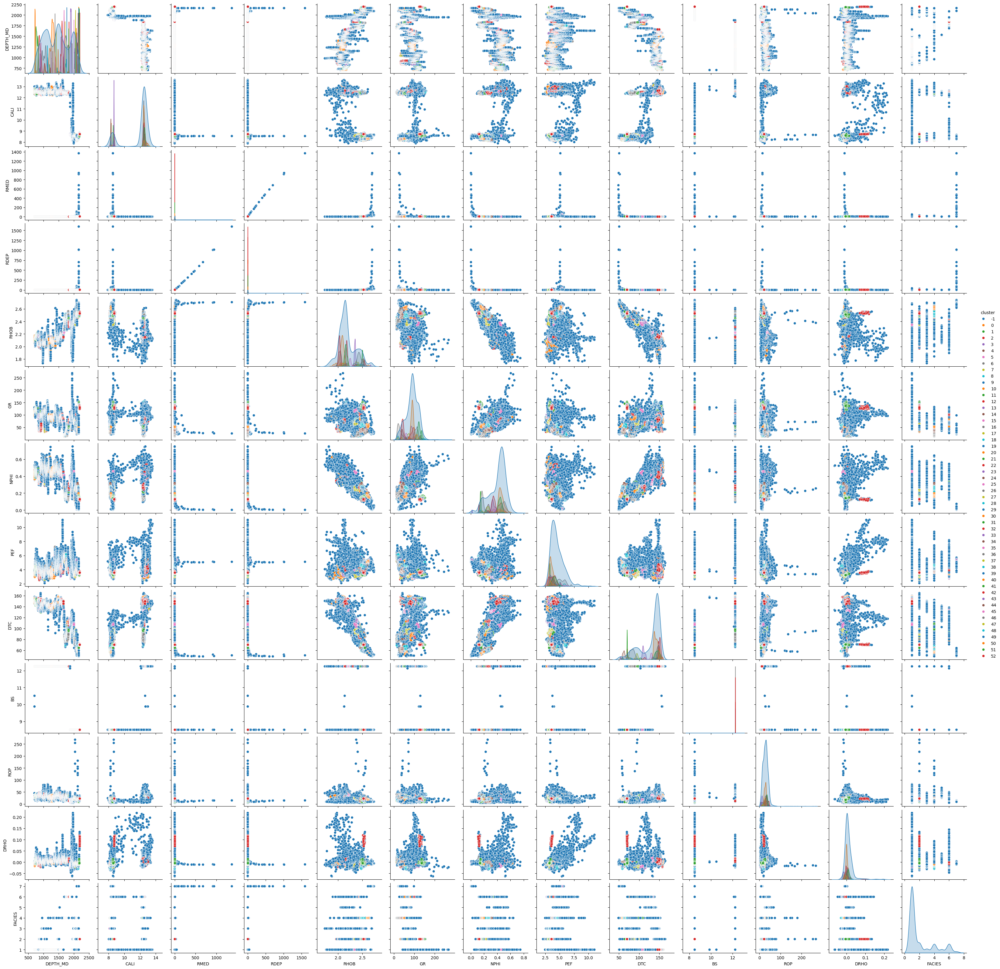

In [141]:
import seaborn as sns

sns.pairplot(datasetB, hue='cluster', palette='tab10')

## Dataset C

In [142]:
import pandas as pd
from scipy import stats
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn import preprocessing
import pylab as pl
import numpy as np
%matplotlib inline

In [143]:
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()
datasetC_scaled= scaler.fit(datasetC)
datasetC_scaled= scaler.transform(datasetC)
datasetC_scaled= pd.DataFrame(datasetC_scaled, columns=datasetC.columns)

In [144]:
datasetC_scaled.head()

,DEPTH_MD,CALI,RMED,RDEP,RHOB,GR,NPHI,PEF,DTC,BS,ROP,DRHO,FACIES
0,-1.696927,0.514704,-0.078902,-0.024666,-0.184046,1.481777,0.698201,-0.705267,0.598098,0.52111,0.423280,-0.527702,-0.726833
1,-1.696538,0.568954,-0.059197,0.046998,-0.215889,1.515532,0.382568,-0.563015,0.605628,0.52111,0.056871,-0.455094,-0.726833
2,-1.696149,0.636336,-0.067636,0.030006,-0.314248,1.569835,0.203755,-0.367795,0.618947,0.52111,-0.357540,-0.360688,-0.726833
3,-1.695760,0.761400,-0.049061,-0.005027,-0.384332,1.605018,0.243812,-0.022920,0.611706,0.52111,-0.619125,-0.119353,-0.726833
4,-1.695371,0.973305,-0.036195,0.026930,-0.423128,1.587220,0.478183,0.546160,0.564690,0.52111,-0.740919,0.388596,-0.726833


<Axes: >

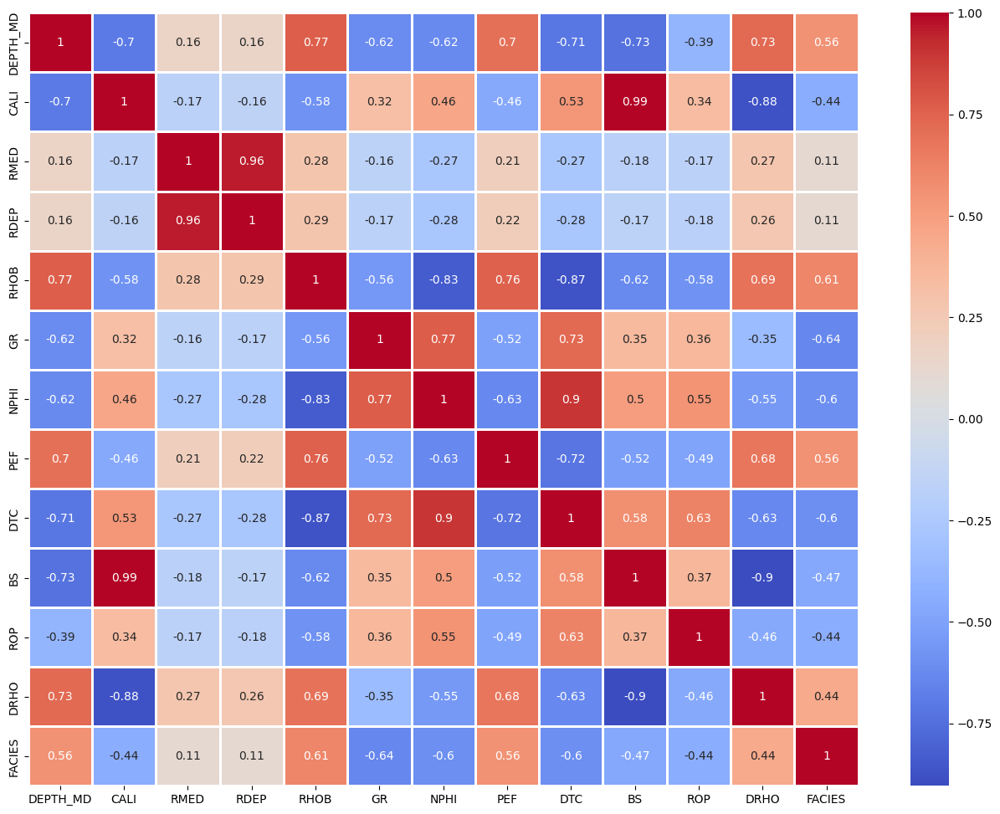

In [145]:
fig=plt.figure(figsize=(16,12))
sns.heatmap(datasetC_scaled.corr(), annot=True, cmap='coolwarm',linewidths=2,linecolor='white')

In [146]:
from numpy.core.numeric import indices
from sklearn.neighbors import NearestNeighbors
Neighbors = NearestNeighbors(n_neighbors=6)
nbrsC = Neighbors.fit(datasetC_scaled)
distances, indices=nbrsC.kneighbors(datasetC_scaled)

/tmp/ipython-input-676052353.py:1: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric.indices.
  from numpy.core.numeric import indices


In [147]:
distances

array([[0.        , 0.36412099, 0.45110498, 0.45313324, 0.45342106,
        0.45690706],
       [0.        , 0.27128544, 0.29114581, 0.32141236, 0.33904515,
        0.34604677],
       [0.        , 0.35864764, 0.3740431 , 0.41123158, 0.41749225,
        0.42025455],
       ...,
       [0.        , 0.16253039, 0.1650582 , 0.19232686, 0.20081624,
        0.21941963],
       [0.        , 0.14215776, 0.16253039, 0.31904329, 0.32224938,
        0.34363455],
       [0.        , 0.14215776, 0.19232686, 0.28672124, 0.3054846 ,
        0.32052497]])

In [148]:
indices

array([[   0,  554,  549,  553,  347,  548],
       [   1,  183,  349,  492,  246,  279],
       [   2,  206,  207,  211,  238,  212],
       ...,
       [8580, 8581, 8579, 8582, 8576, 8575],
       [8581, 8582, 8580, 8576, 8579, 8575],
       [8582, 8581, 8580, 8576, 8575, 8579]])

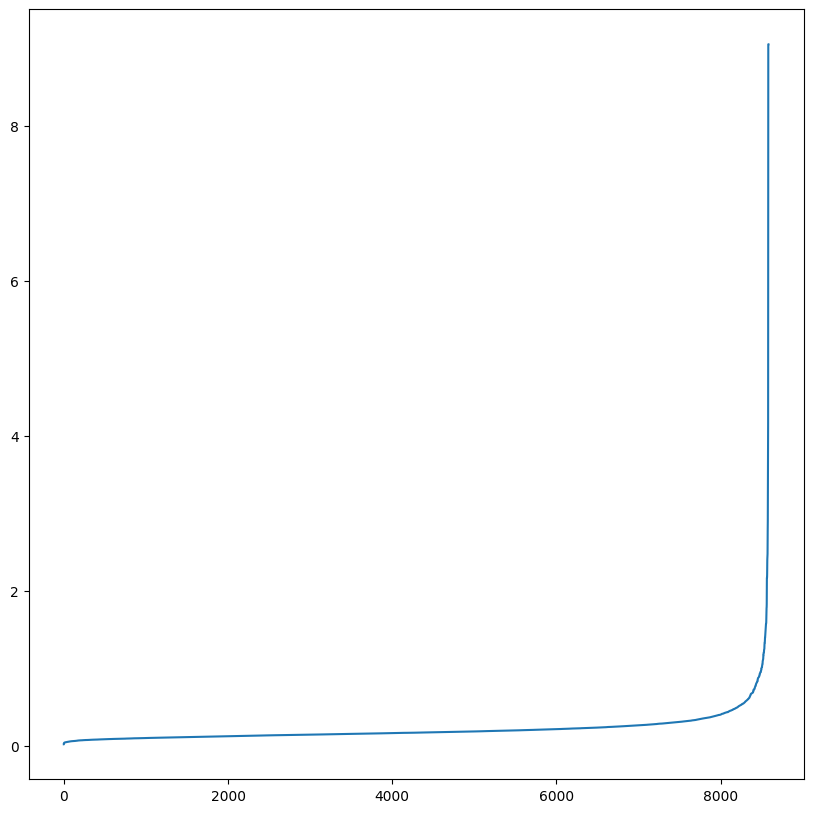

In [149]:
fig = plt.figure(figsize=(10,10))
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

### Simple DBScan

In [150]:
from sklearn.cluster import DBSCAN

modelC = DBSCAN(eps=0.3, min_samples=6)
resultC = modelC.fit_predict(datasetC_scaled)

In [151]:
pd.DataFrame(resultC).value_counts()

,count
0,
-1,3192
78,713
42,686
93,471
41,422
...,...
47,5
44,5
1,4


In [152]:
from sklearn.metrics import silhouette_score

silhouette_score(datasetC_scaled, resultC)

np.float64(-0.19924758408442195)

In [153]:
labelsC = modelC.labels_
n_clusterC = len(set(labelsC)) - (1 if -1 in labelsC else 0)
n_noiseC = list(labelsC).count(-1)

In [154]:
n_clusterC

102

In [155]:
n_noiseC

3192

### Hyperparameter Tunning

In [156]:
eps_rangeC = np.linspace(0.2, 0.5, 5)
sample_rangeC = np.arange(4, 15, 2)
tuningC = []
for i in range(len(eps_rangeC)):
  for j in range(len(sample_rangeC)):
    dummyC = []
    modelC = DBSCAN(eps=eps_rangeC[i], min_samples=sample_rangeC[j])
    resultC = modelC.fit_predict(datasetC_scaled)
    scoreC = silhouette_score(datasetC_scaled, resultC)
    labelsC = modelC.labels_
    n_clusterC = len(set(labelsC)) - (1 if -1 in labelsC else 0)
    n_noiseC = list(labelsC).count(-1)
    dummyC.append(eps_rangeC[i])
    dummyC.append(sample_rangeC[j])
    dummyC.append(scoreC)
    dummyC.append(n_clusterC)
    dummyC.append(n_noiseC)
    tuningC.append(dummyC)

In [157]:
tuning_resultC = pd.DataFrame(tuning, columns=['epsC', 'min_samplesC', 'silhouette_score', 'n_clusterC', 'n_noiseC'])
tuning_resultC.sort_values(by=['silhouette_score'])

,epsC,min_samplesC,silhouette_score,n_clusterC,n_noiseC
0,0.200,4,-0.599952,171,8823
1,0.200,6,-0.583515,41,9630
9,0.275,10,-0.548240,32,8930
8,0.275,8,-0.530513,59,8399
10,0.275,12,-0.527953,17,9256
7,0.275,6,-0.488360,98,7623
6,0.275,4,-0.429493,291,5972
17,0.350,14,-0.377669,31,7286
15,0.350,10,-0.354294,35,6536
11,0.275,14,-0.345230,13,9423


<Axes: xlabel='min_samplesC', ylabel='epsC'>

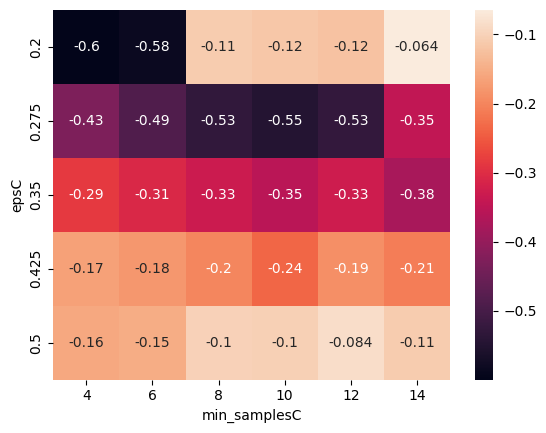

In [158]:
tuning_pivotC = tuning_resultC.pivot(index='epsC', columns='min_samplesC', values='silhouette_score')
sns.heatmap(tuning_pivotC, annot=True)

### Final Clustering

In [159]:
modelC = DBSCAN(eps=0.425, min_samples=10)
resultC = modelC.fit_predict(datasetC_scaled)
datasetC['cluster'] = resultC

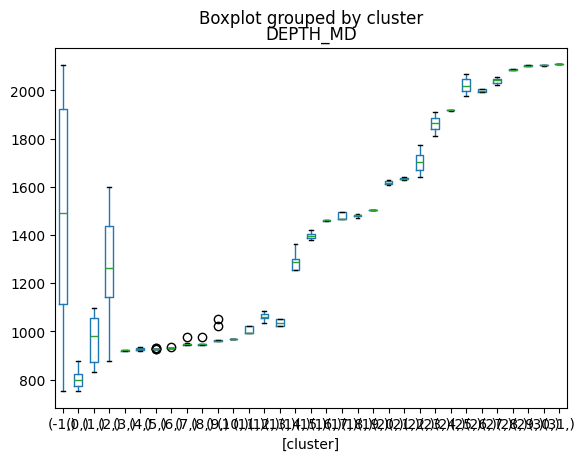

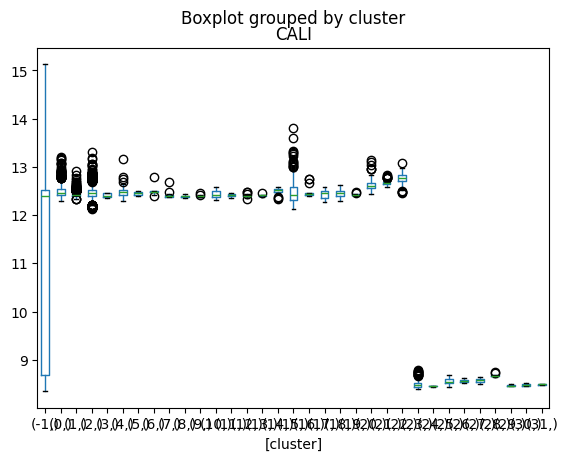

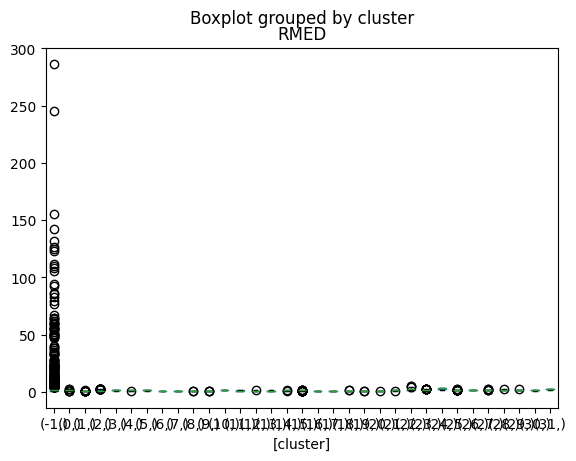

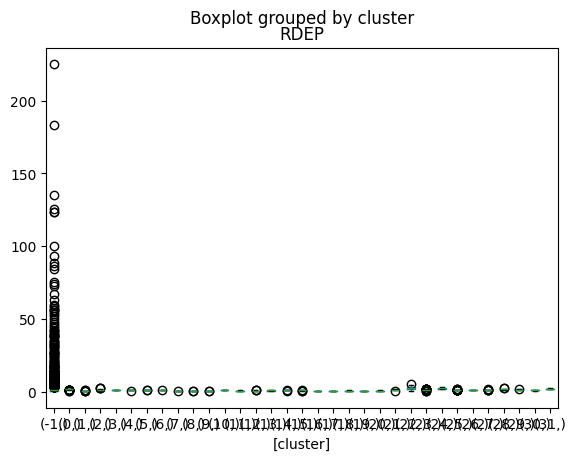

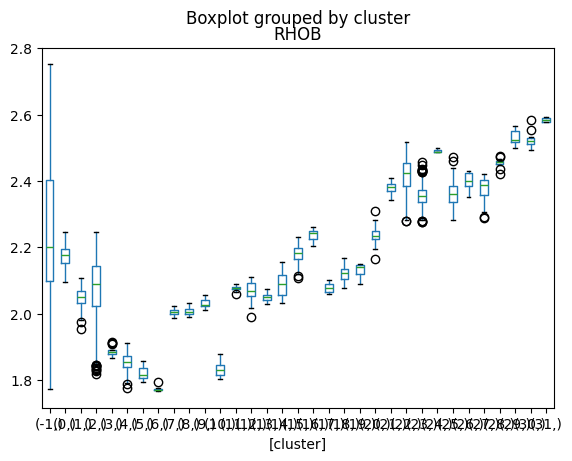

...

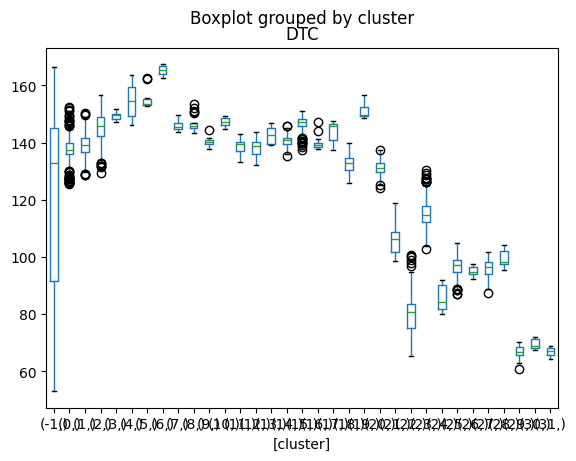

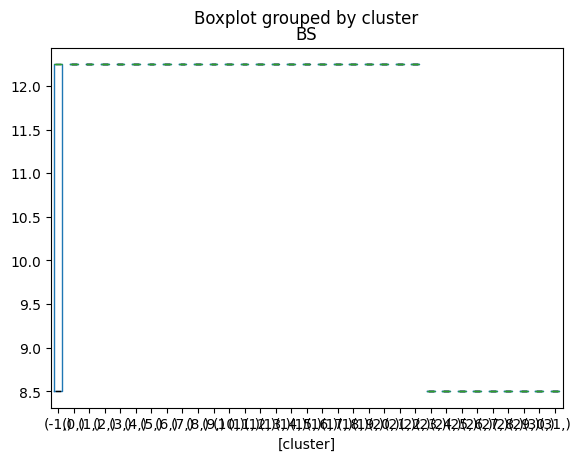

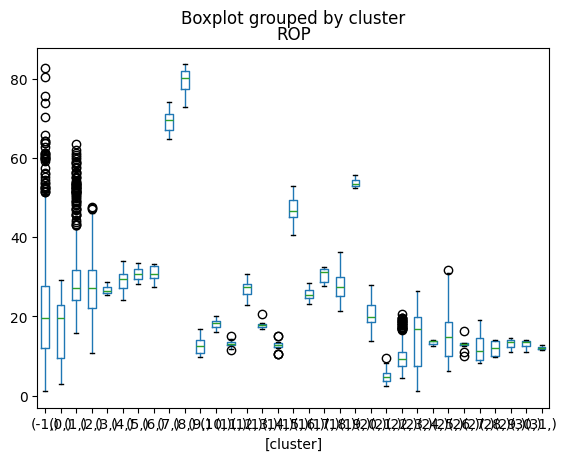

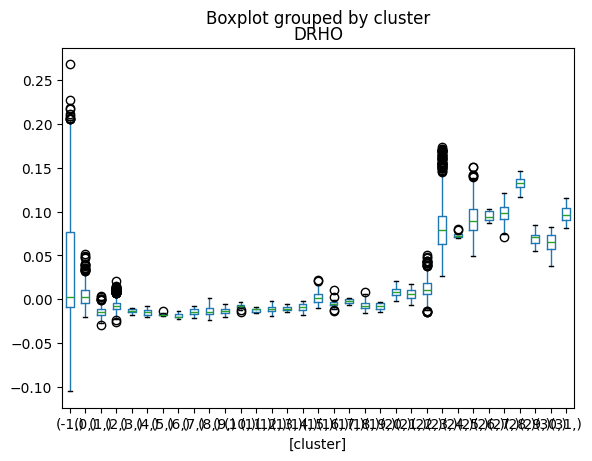

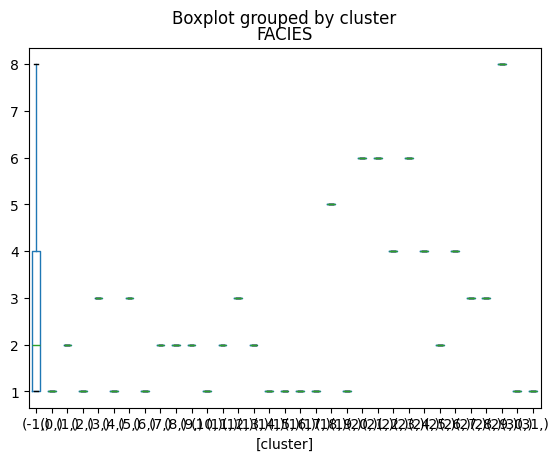

In [160]:
for i in range((len(datasetC.columns)-1)):
  datasetC.boxplot(column=[datasetC.columns[i]], by=['cluster'], grid=False)

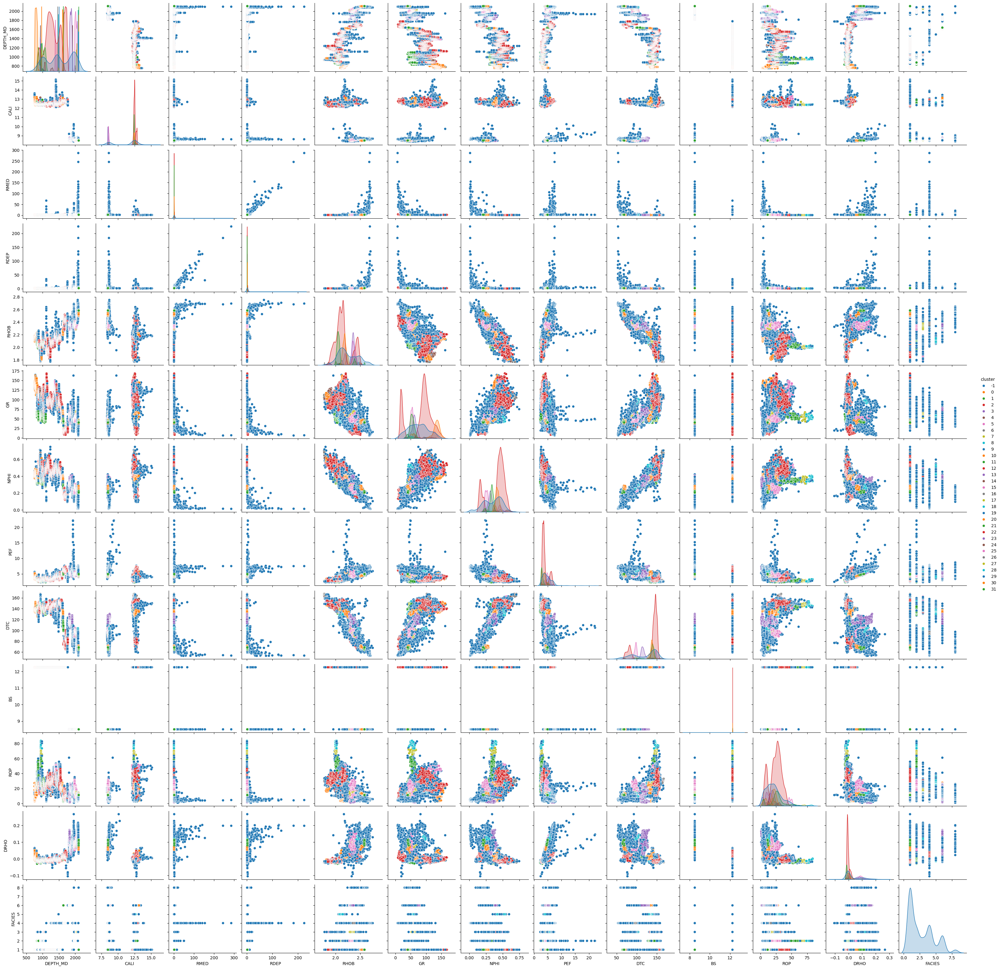

In [161]:
import seaborn as sns

sns.pairplot(datasetC, hue='cluster', palette='tab10')